### Rpy2 package

In [1]:
%load_ext rpy2.ipython

### Importing R packages

In [2]:
%R library(latentcor)
%R library(sn)

R[write to console]: Loading required package: stats4

R[write to console]: Package 'sn', 2.0.2 (2022-03-07). Type 'help(SN)' and 'help(overview-sn)' for basic information.
The package redefines function 'sd' but its usual working is unchanged.

R[write to console]: 
Attaching package: ‘sn’


R[write to console]: The following object is masked from ‘package:stats’:

    sd




'sn','stats4','latentcor',...,'datasets','methods','base'


### Importing Python libraries

In [3]:
import pandas as pd
import warnings
import numpy as np
import multiprocessing
import math
from timeit import default_timer as timer
from joblib import Parallel, delayed


#Number of cores
num_cores = multiprocessing.cpu_count()

jobs=num_cores-1


import matplotlib.pyplot as plt
%matplotlib inline

#knockpy
import knockpy
from knockpy.knockoff_filter import KnockoffFilter
from knockpy.knockoff_stats import data_dependent_threshhold

#GGlasso
from gglasso.problem import glasso_problem


In [4]:
#Import the package rpy2
import rpy2
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects import r, pandas2ri
from rpy2.robjects.conversion import localconverter

# import R's packages
base = importr('base')
glmnet = importr('glmnet')
dplyr = importr('dplyr')
survival = importr('survival')

### Auxiliary functions

In [5]:
#Function to make selections
def make_selections(W, fdr):
    """" Calculate data dependent threshhold and selections """
    threshold = data_dependent_threshhold(W=W, fdr=fdr)
    selected_flags = (W >= threshold).astype("float32")
    return selected_flags


def glasso_function(x):
    
    #Instantiate the  glasso_problem
    x = np.array(x)
    P = glasso_problem(x, N=n, reg_params = {'lambda1': 0.05}, latent = False, do_scaling = False)

    # Next, do model selection by solving the problem on a range of lambda values.
    lambda1_range = np.logspace(1, -5, 30)
    modelselect_params = {'lambda1_range': lambda1_range}
    P.model_selection(modelselect_params = modelselect_params, method = 'eBIC', gamma = 0.1)

    #Precision and Sigma matrices
    sol = P.solution.precision_
    return np.linalg.inv(sol)   

def lasso_glmnet(x):
    
  #Transformation to a pandas data.frame
  x = pd.DataFrame(x)
  
  #Convertion of the pandas dataframe to a R dataframe  
  sim = x
  with localconverter(robjects.default_converter + pandas2ri.converter):
    r_sim = robjects.conversion.py2rpy(sim)
  robjects.globalenv["r_sim"] = r_sim
  
  #Loading R libraries  
  base = importr('base')
  glmnet = importr('glmnet')
  dplyr = importr('dplyr')
  survival = importr('survival')

  #Fitting the Cox’s proportional hazards model employing GLMNET
  robjects.r('''
        X <- r_sim %>% select(-c("Status", "Survival_time"))
        X_matrix <- as.matrix(X)
        y <- r_sim %>% select(c("Status", "Survival_time"))
        y_surv <- Surv(y$Survival_time,y$Status)
        cvfit <- cv.glmnet(X_matrix, y_surv, alpha=1, family = "cox", type.measure = "C", nfolds = 5, standardize = TRUE)
        fit <- glmnet(X_matrix,y_surv, alpha = 1, lambda =cvfit$lambda.min, family = "cox", standardize = TRUE)
        fit_coef <- coef(fit)
        fit_coef_vec <- as.vector(fit_coef)
        ''')
  #Coefficients of the best model 
  r_fit_coef_vec = robjects.globalenv['fit_coef_vec']  
  #Transformation to a numpy array
  fit_coef_vec = np.array(r_fit_coef_vec)
    
  return fit_coef_vec

def latentcor_estimation(x, types):
    
  #Transformation to a pandas data.frame
  x = pd.DataFrame(x)
  
  #Convertion of the pandas dataframe to a R dataframe  
  sim = x
  with localconverter(robjects.default_converter + pandas2ri.converter):
    r_sim = robjects.conversion.py2rpy(sim)
  
  robjects.globalenv["r_sim"] = r_sim
  robjects.globalenv["types"] = types
  
  #Loading R libraries  
  base = importr('base')
  latentcor = importr('latentcor')
  dplyr = importr('dplyr')

  #Fitting the 
  robjects.r('''
        latentcor_hat_r <- latentcor(r_sim , types = types, method="original")$R  
        ''')
      
  #Matrix transformation to a numpy array
  latentcor_hat_r = robjects.globalenv['latentcor_hat_r']
  latentcor_hat = np.array(latentcor_hat_r)

  return latentcor_hat


### Simulation setup

In [6]:
t_initial = timer()

n = 300 #Number of observations
#p = 300 #Number of variables

p_bin = 20 #Number of binary covariates

#Active covariates
p_nonnull_cont = 35
p_nonnull_ordinal = 5 

#Number of simulations
nsim = 200

n_cv = 5  #Cross validation
FDR = 0.2 #False discovery rate

#Survival Weibull distribution parameters (scale --> sigma, shape --> nu, lambda=1/(scale^shape))
lambda_T = 0.05 # lamnda=1/(scale^shape)=1/(sigma^nu)=1/(sigma^a)
nu_T = 1.5 # With nu_T=1(shape_T=1) we have the exponential distribution 

#Beta coefficients
beta_coef_1 =  np.array([ 1,  1, -1, -1,  1,  1, -1,  1, -1, -1,  1, -1,  1, 
         1, -1,  -1,  1, -1, -1,  1, -1,  1, -1,   1, -1,  1,
       -1,  1, -1,  1, -1, -1,  1,  1,  1,  1, -1, -1,   1, -1])

#beta_coef = beta_coef_1
#To change the coefficient's magnitud
beta_coef = np.where(beta_coef_1==1, 0.7, -0.7)

#Censored upper limit
u_max= 61.3

#Number of elements by block
b_by_block = 10 #

#Correlation AR1(by blocks)
rho = 0.6


#Skew-t distribution
skew_dist = "Yes" # values ["Yes", "No"]
alpha_level = 2
nu_level = 5


# p=200

In [7]:
replication = 0
p = 200 #Number of variables

### Correlation matrix

In [8]:
#From Pyhton to R
%R -i p
%R -i b_by_block
%R -i rho

%R n_blocks <- p%/%b_by_block
%R covMat <- diag(n_blocks) %x% matrix(rho^abs(matrix(1:b_by_block,b_by_block, b_by_block, byrow = TRUE) - matrix(1:b_by_block, b_by_block, b_by_block)), b_by_block, b_by_block)
%R diag(covMat) <- 1

#From R to Pyhton
%R -o covMat
 

In [9]:
#For the truncated ECFD estimator
delta_n = 1/( (4*n**(1/4))*math.sqrt(math.pi*math.log(n)) )

### Simulations: design matrix X and survival time t

In [10]:
if 'X' in globals():
    del X

In [11]:
#Arrays and lists to save information
ls_simulations = list(range(nsim))
ls_beta = list(range(nsim))
ls_X = list(range(nsim))
ls_types = list(range(nsim))
np_censoring = np.zeros(nsim)
np_mean_survival_time = np.zeros(nsim)

ti = timer() #Initial time


for i in range(nsim):
    
  #Set seed for replication
  np.random.seed(i+replication)  #Python
  %R -i i
  %R -i replication
  %R set.seed(i+replication)  #R

  #Sigma assignation
  Sigma = covMat

  #From Python to R 
  %R -i Sigma
  %R -i n
  %R -i p_bin
  %R -i p  
  %R -i p_nonnull_ordinal 
  %R -i p_nonnull_cont 
  %R -i alpha_level
  %R -i nu_level

  #Creation of the vector with correlation information
  %R lowerpart <- lower.tri(Sigma)
  %R rhos <- Sigma[lowerpart] 
  %R p_con <- p - p_bin


  #Binary and continiuos variables
  %R binary <- rep("bin", p_bin)
  %R con <- rep("con", p_con)
  %R types <- sample(c(binary, con))
  
  #Simulations of a mixed random vector
  %R X_norm_bin <- as.data.frame(gen_data(n = n, types = types, rhos = rhos, copulas="no", XP = NULL, showplot = FALSE)$X)
  %R X <- X_norm_bin

  if (skew_dist=="Yes"):  
    #There is seldom an error using the default solver "NB" for the function qsn().
    #Thus, in case of error, the solver is switched to "RFB"
    %R for(i in 1:p) {   if(types[i]=="con"){ tryCatch({X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level,nu=nu_level))}, error=function(e){X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level, nu=nu_level, solver="RFB"))}) }}
      
  #Creating a dataframe using the design matrix X
  #From R to Pyhton
  %R -o X 
  %R -o types
  %R -o p_con
  
  X.reset_index(drop=True, inplace=True)
  ls_X[i] = X
  ls_types[i] = types
  df_X = pd.DataFrame(X)

  #Names for the variables (X)
  numbers = np.arange(1,p+1)
  var_names = ['Var'+ str(number) for number in numbers]
  df_X.columns= var_names

  #Survival time simulation

  #Extracting the ordinal and continuous variables
  %R col_ind_ordinal <- sapply(X, function(col) length(unique(col)) < 4)
  %R col_ind_cont <- sapply(X, function(col) length(unique(col)) > 4)
  %R col_names <- names(X)
  %R col_names_ordinal <- col_names[col_ind_ordinal]
  %R col_names_cont <- col_names[col_ind_cont]  

  #Variables and coefficients nonnull
  if (p_nonnull_ordinal==0):
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE))
  else:
      #If there are ordinal nonnull variables the proportion of nonnull continuous and nonnull ordinal
      #remains the same between diferent simulated data sets  
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE), sample(col_names_ordinal, size=p_nonnull_ordinal, replace=FALSE))
    
  %R ind_betas <- as.numeric(substr(col_nonnull,start=2,stop=4))
  %R -o ind_betas 
  ind_betas_sort = np.sort(ind_betas.astype(int))
  
  #betas and magnitud
  beta = np.zeros(p,dtype=float)
  beta[ind_betas_sort-1] = beta_coef
  ls_beta[i] = beta

  #Survival time simulations (Bender et al. 2006)
  t = ( - (np.log(np.random.uniform(low=0.0, high=1.0, size=n)) )/( lambda_T*np.exp( np.dot(X, beta) ) ))**(1/nu_T)

  #Censored time and censored indicator
  t_cens = np.random.uniform(0, u_max, size=n) 
  I_cens = np.where(t<= t_cens, 1, 0)

  #Observed time 
  t_obs = np.minimum(t, t_cens)    

  #Creating the dataframe with survival information
  df_Y = pd.DataFrame({ 'Status':I_cens,'Survival_time':t_obs})
  
  #Data frame with simulated data (Y,X)
  ls_simulations[i] = pd.concat([df_Y,df_X], axis=1)

  #Saving information
  np_censoring[i] = np.around((1-ls_simulations[i]["Status"].sum()/n)*100,decimals=4)
  np_mean_survival_time[i] = ls_simulations[i]["Survival_time"].mean()
    
  #Eliminating X (If not, X causes problems in the loop)
  del X

time_simulations_1 = timer() - ti 

Censoring's level

In [12]:
np_censoring

array([31.6667, 34.3333, 31.    , 33.6667, 29.3333, 32.6667, 27.6667,
       32.6667, 17.3333, 32.    , 28.    , 33.6667, 33.6667, 25.3333,
       24.3333, 25.6667, 27.6667, 22.3333, 40.3333, 32.    , 25.3333,
       35.    , 35.3333, 22.6667, 32.    , 33.6667, 32.6667, 31.3333,
       33.3333, 33.6667, 27.    , 37.3333, 25.3333, 31.3333, 28.    ,
       25.3333, 33.3333, 27.    , 32.6667, 26.    , 27.    , 34.3333,
       35.6667, 30.3333, 25.    , 29.6667, 30.3333, 25.3333, 35.    ,
       34.    , 35.3333, 34.    , 33.6667, 28.3333, 25.3333, 32.3333,
       33.6667, 34.3333, 31.6667, 34.3333, 22.3333, 33.3333, 36.3333,
       20.6667, 32.    , 30.6667, 26.6667, 29.3333, 28.    , 34.3333,
       37.6667, 24.6667, 26.    , 37.3333, 26.    , 34.    , 30.3333,
       32.3333, 21.6667, 39.    , 23.6667, 27.6667, 25.3333, 19.    ,
       34.6667, 31.    , 28.3333, 29.    , 25.6667, 31.3333, 30.6667,
       32.3333, 30.6667, 21.6667, 30.6667, 35.6667, 34.    , 36.6667,
       25.3333, 34. 

In [13]:
np_censoring.mean()

29.8066635

### Cox’s proportional hazards model  with lasso penalization (glmnet)

In [14]:
np_Number_CoxLasso_Rejections = np.zeros(nsim)
np_CoxLasso_Power = np.zeros(nsim)
np_CoxLasso_FDP = np.zeros(nsim)
np_CoxLasso_FD = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
ls_coef_CoxLasso = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations)

for i in range(nsim):
  fit_coef_vec = ls_coef_CoxLasso[i] 
  
  #Variable selection of the Penalized Cox proportional hazard model  
  np_Number_CoxLasso_Rejections[i] = np.sum(fit_coef_vec!= 0)
  print("Number of non-zero coefficients: {}".format(np_Number_CoxLasso_Rejections[i]))
  np_rejections_CoxLasso = np.where(fit_coef_vec!= 0,1,0)

  #Printing and saving the Power and FDP of the Penalized Cox proportional hazard model  
  np_CoxLasso_Power[i] = np.around(100*(np.dot(np_rejections_CoxLasso, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_CoxLasso_FDP[i] = np.around(100*np.dot(np_rejections_CoxLasso, ls_beta[i] == 0) / np_rejections_CoxLasso.sum(), decimals=2)
  np_CoxLasso_FD[i] = np.around(np.dot(np_rejections_CoxLasso, ls_beta[i] == 0))
  print(f"The Penalized Cox proportional hazards model has discovered {np_CoxLasso_Power[i]}% of the non-nulls with a FDP of {np_CoxLasso_FDP[i]}%")

time_CoxLASSO_1 = timer() - ti 

Number of non-zero coefficients: 106.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 62.26%
Number of non-zero coefficients: 120.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 66.67%
Number of non-zero coefficients: 107.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 62.62%
Number of non-zero coefficients: 110.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 63.64%
Number of non-zero coefficients: 86.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 54.65%
Number of non-zero coefficients: 89.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 55.06%
Number of non-zero coefficients: 94.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 57.

/tmp/ipykernel_63543/4205339522.py:21: RuntimeWarning: invalid value encountered in long_scalars
  np_CoxLasso_FDP[i] = np.around(100*np.dot(np_rejections_CoxLasso, ls_beta[i] == 0) / np_rejections_CoxLasso.sum(), decimals=2)


### Estimation of the Latent correlation matrix 

In [15]:
#matrices_latentcor = list(range(nsim))
np_Frobenius_norm_latentcor = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_latentcor = Parallel(n_jobs=jobs)(delayed(latentcor_estimation)(x,types) for x,types in zip(ls_X,ls_types))

for i in range(nsim):
    
  #Relative Frobenius norm
  np_Frobenius_norm_latentcor[i]= np.linalg.norm(matrices_latentcor[i] -covMat, 'fro')/np.linalg.norm(covMat, 'fro')

time_latentcor_1 = timer() - ti 

### Graphical Lasso estimation

In [16]:
np_Frobenius_norm_Sigma_hat = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_Sigma_hat = Parallel(n_jobs=jobs)(delayed(glasso_function)(x) for x in matrices_latentcor)

for i in range(nsim):
    
    #Relative Frobenius norm
    np_Frobenius_norm_Sigma_hat[i]= np.linalg.norm(matrices_Sigma_hat[i]-covMat, 'fro')/np.linalg.norm(covMat, 'fro')

    
time_GraphicalLASSO_1 = timer() - ti 

ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminate

ADMM terminated after 890 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 910 iterations with status: optimal.
ADMM terminated after 736 iterations with status: optimal.
ADMM terminated after 564 iterations with status: optimal.
ADMM terminated after 383 iterations with status: optimal.
ADMM terminated after 213 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.

ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 664 iterations with status: optimal.
ADMM terminated after 591 iterations with status: optimal.
ADMM terminated after 354 iterations with status: optimal.
ADMM terminated after 243 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: o

ADMM terminated after 58 iterations with status: optimal.
ADMM terminated after 90 iterations with status: optimal.
ADMM terminated after 85 iterations with status: optimal.
ADMM terminated after 148 iterations with status: optimal.
ADMM terminated after 175 iterations with status: optimal.
ADMM terminated after 276 iterations with status: optimal.
ADMM terminated after 370 iterations with status: optimal.
ADMM terminated after 521 iterations with status: optimal.
ADMM terminated after 616 iterations with status: optimal.
ADMM terminated after 878 iterations with status: optimal.
ADMM terminated after 918 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 895 iterations with status: optimal.
ADMM terminated after 662 iterations with status: optimal.
ADMM terminated after 607 iterations with status: optimal.
ADMM terminated after 408 iterations with status: optimal.
ADMM terminated after 189 iterations with status: o

ADMM terminated after 609 iterations with status: optimal.
ADMM terminated after 506 iterations with status: optimal.
ADMM terminated after 231 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM termin

ADMM terminated after 232 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminat

ADMM terminated after 167 iterations with status: optimal.
ADMM terminated after 264 iterations with status: optimal.
ADMM terminated after 506 iterations with status: optimal.
ADMM terminated after 497 iterations with status: optimal.
ADMM terminated after 902 iterations with status: optimal.
ADMM terminated after 846 iterations with status: optimal.
ADMM terminated after 863 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 845 iterations with status: optimal.
ADMM terminated after 973 iterations with status: optimal.
ADMM terminated after 571 iterations with status: optimal.
ADMM terminated after 385 iterations with status: optimal.
ADMM terminated after 265 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: op

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 863 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 933 iterations with status: optimal.
ADMM terminated after 981 iterations with status: optimal.
ADMM terminated after 580 iterations with status: optimal.
ADMM terminated after 373 iterations with status: optimal.
ADMM terminated after 252 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.

ADMM terminated after 671 iterations with status: optimal.
ADMM terminated after 864 iterations with status: optimal.
ADMM terminated after 991 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 898 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 634 iterations with status: optimal.
ADMM terminated after 369 iterations with status: optimal.
ADMM terminated after 239 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminate

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminate

ADMM terminated after 92 iterations with status: optimal.
ADMM terminated after 89 iterations with status: optimal.
ADMM terminated after 153 iterations with status: optimal.
ADMM terminated after 195 iterations with status: optimal.
ADMM terminated after 284 iterations with status: optimal.
ADMM terminated after 332 iterations with status: optimal.
ADMM terminated after 532 iterations with status: optimal.
ADMM terminated after 723 iterations with status: optimal.
ADMM terminated after 874 iterations with status: optimal.
ADMM terminated after 877 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 860 iterations with status: optimal.
ADMM terminated after 991 iterations with status: optimal.
ADMM terminated after 504 iterations with status: optimal.
ADMM terminated after 270 iterations with status: optimal.
ADMM terminated after 256 iterations with status: optimal.
ADMM terminated after 22 iterations with status: o

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 229 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminat

ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 57 iterations with status: optimal.
ADMM terminated after 90 iterations with status: optimal.
ADMM terminated after 87 iterations with status: optimal.
ADMM terminated after 152 iterations with status: optimal.
ADMM terminated after 172 iterations with status: optimal.
ADMM terminated after 276 iterations with status: optimal.
ADMM terminated after 358 iterations with status: optimal.
ADMM terminated after 519 iterations with status: optimal.
ADMM terminated after 753 iterations with status: optimal.
ADMM terminated after 868 iterations with status: optimal.
ADMM terminated after 828 iterations with status: optimal.
ADMM t

ADMM terminated after 528 iterations with status: optimal.
ADMM terminated after 589 iterations with status: optimal.
ADMM terminated after 878 iterations with status: optimal.
ADMM terminated after 927 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 939 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 593 iterations with status: optimal.
ADMM terminated after 485 iterations with status: optimal.
ADMM terminated after 241 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with statu

ADMM terminated after 882 iterations with status: optimal.
ADMM terminated after 855 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 944 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 584 iterations with status: optimal.
ADMM terminated after 340 iterations with status: optimal.
ADMM terminated after 266 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status:

ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 58 iterations with status: optimal.
ADMM terminated after 90 iterations with status: optimal.
ADMM terminate

ADMM terminated after 858 iterations with status: optimal.
ADMM terminated after 984 iterations with status: optimal.
ADMM terminated after 671 iterations with status: optimal.
ADMM terminated after 525 iterations with status: optimal.
ADMM terminated after 357 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM term

ADMM terminated after 144 iterations with status: optimal.
ADMM terminated after 173 iterations with status: optimal.
ADMM terminated after 264 iterations with status: optimal.
ADMM terminated after 377 iterations with status: optimal.
ADMM terminated after 497 iterations with status: optimal.
ADMM terminated after 660 iterations with status: optimal.
ADMM terminated after 831 iterations with status: optimal.
ADMM terminated after 869 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 840 iterations with status: optimal.
ADMM terminated after 963 iterations with status: optimal.
ADMM terminated after 600 iterations with status: optimal.
ADMM terminated after 321 iterations with status: optimal.
ADMM terminated after 247 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: o

ADMM terminated after 732 iterations with status: optimal.
ADMM terminated after 869 iterations with status: optimal.
ADMM terminated after 868 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 933 iterations with status: optimal.
ADMM terminated after 999 iterations with status: optimal.
ADMM terminated after 588 iterations with status: optimal.
ADMM terminated after 356 iterations with status: optimal.
ADMM terminated after 291 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optima

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

### Knockoffs sampling

In [17]:
ls_simulations_Xk_hat = list(range(nsim))

ti = timer() # Initial time for the loop

for i in range(nsim):

  X = ls_X[i]
  df_X = ls_X[i] 
  types = ls_types[i]
  
  #From Python to R
  %R -i X 
  %R -i types
  %R -i delta_n
  
  #Transformation of the marginal distribution to normal distribution
  %R X_ecdf <- X  
  %R X_norm_hat <- X
  
  #Empirical cumulative distribution function
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i] <- as.vector(ecdf(X[,i])(X[,i])) }}

  #For truncation:
  #Continuous variables
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] < delta_n] <- delta_n }}
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] > (1-delta_n)] <- 1-delta_n }}                                    
  %R for(i in 1:p) {   if(types[i]=="con"){ X_norm_hat[,i] <- as.vector(qnorm( X_ecdf[,i] ) )}}
  #Ordinal variables
  %R for(i in 1:p) {   if(types[i]=="bin"){ X_norm_hat[,i][X[,i]==0] = (-1)}}  

  #From R to Python
  %R -o X_norm_hat
    
  #Object for Gaussian knockoffs using the Sigma_hat and method mvr
  Gaussian_sampler_hat = knockpy.knockoffs.GaussianSampler(X_norm_hat.to_numpy(), mu=None,
                                                           Sigma=matrices_Sigma_hat[i],
                                                           method='mvr', verbose=False)
  Xk_norm_hat = Gaussian_sampler_hat.sample_knockoffs()  

  
  #Creating a dataframes from the knockoffs Xk_norm_hat
  df_Xk_norm_hat = pd.DataFrame(Xk_norm_hat)

  #From Python to R
  %R -i df_Xk_norm_hat
  
  #Transformation of Gaussian knockoffs to the original marginal distribution
  %R df_Xk_hat <- df_Xk_norm_hat
   
  %R for(i in 1:p) {   if(types[i]=="con"){ df_Xk_hat[,i] <- as.vector(quantile(X[,i], probs=pnorm(df_Xk_norm_hat[,i]), type=8)) }}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]>=0]= 1}}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]<0]= 0}}
  
  #From R to Python  
  %R -o df_Xk_hat
  df_Xk_hat.reset_index(drop=True, inplace=True)
    
  #Creating the names for the variables in X
  numbers = np.arange(1,p+1)
  kvar_names = ['KVar'+ str(number) for number in numbers]
  df_Xk_hat.columns= kvar_names     

  #Final dataset
  ls_simulations_Xk_hat[i] = pd.concat([ls_simulations[i], df_Xk_hat], axis=1)
  
time_knockoffs_1 = timer() - ti 

### Cox’s proportional hazards model  with lasso penalization for (X,Xk_hat) (glmnet) 

In [18]:
np_Number_CoxLasso_Rejections_knockoff_hat = np.zeros(nsim)

tii = timer()#Initial time

#Parallel code with Joblib
ls_coef_knockoff_hat = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations_Xk_hat)

for i in range(nsim): 
    np_Number_CoxLasso_Rejections_knockoff_hat[i] = np.sum(ls_coef_knockoff_hat[i]!= 0)

time_CoxLASSO_X_Xk_1 = timer() - tii 

### Wj using the LASSO coeficient difference statistics and threshold rejection

In [19]:
np_Number_Rejections_knockoff_hat = np.zeros(nsim)
np_knockoff_hat_Power = np.zeros(nsim)
np_knockoff_hat_FDP = np.zeros(nsim)
np_knockoff_hat_FD = np.zeros(nsim)

for i in range(nsim): 
  
  #feature important asignation
  Z = ls_coef_knockoff_hat[i]

  #Wj statistic
  pair_W = np.abs(Z[0:p]) - np.abs(Z[p:])

  #Threshold selection and variable selection 
  threshold = data_dependent_threshhold(W=pair_W, fdr= FDR)
  print("Threshold for knockoffs ")
  print(threshold)
  rejections = make_selections(W=pair_W, fdr= FDR)

  #Printing and saving the Power and FDP of the knockoff procedure   
  np_Number_Rejections_knockoff_hat[i] = rejections.sum()
  print("Number of non-zero knockoff coefficients: {}".format(np_Number_Rejections_knockoff_hat[i]))
  np_knockoff_hat_Power[i] = np.around(100*(np.dot(rejections, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_knockoff_hat_FDP[i] = np.around(100*np.dot(rejections, ls_beta[i] == 0) / rejections.sum(), decimals=2)
  np_knockoff_hat_FD[i] = np.around(np.dot(rejections, ls_beta[i] == 0) )
  print(f"The knockoff filter has discovered {np_knockoff_hat_Power[i]}% of the non-nulls with a FDP of {np_knockoff_hat_FDP[i]}%")


Threshold for knockoffs 
0.11541380474155151
Number of non-zero knockoff coefficients: 35.0
The knockoff filter has discovered 82.5% of the non-nulls with a FDP of 5.71%
Threshold for knockoffs 
0.06069561115625078
Number of non-zero knockoff coefficients: 49.0
The knockoff filter has discovered 95.0% of the non-nulls with a FDP of 22.45%
Threshold for knockoffs 
0.09949585429363181
Number of non-zero knockoff coefficients: 46.0
The knockoff filter has discovered 95.0% of the non-nulls with a FDP of 17.39%
Threshold for knockoffs 
0.06732137470822423
Number of non-zero knockoff coefficients: 49.0
The knockoff filter has discovered 100.0% of the non-nulls with a FDP of 18.37%
Threshold for knockoffs 
0.1347148764715797
Number of non-zero knockoff coefficients: 41.0
The knockoff filter has discovered 87.5% of the non-nulls with a FDP of 14.63%
Threshold for knockoffs 
0.12763374451602508
Number of non-zero knockoff coefficients: 35.0
The knockoff filter has discovered 80.0% of the non-nu

Threshold for knockoffs 
0.06121819308614337
Number of non-zero knockoff coefficients: 46.0
The knockoff filter has discovered 95.0% of the non-nulls with a FDP of 17.39%
Threshold for knockoffs 
0.062274650436575776
Number of non-zero knockoff coefficients: 47.0
The knockoff filter has discovered 95.0% of the non-nulls with a FDP of 19.15%
Threshold for knockoffs 
0.047534999506889296
Number of non-zero knockoff coefficients: 51.0
The knockoff filter has discovered 95.0% of the non-nulls with a FDP of 25.49%
Threshold for knockoffs 
0.10803666584503274
Number of non-zero knockoff coefficients: 56.0
The knockoff filter has discovered 97.5% of the non-nulls with a FDP of 30.36%
Threshold for knockoffs 
0.08354335067794717
Number of non-zero knockoff coefficients: 46.0
The knockoff filter has discovered 92.5% of the non-nulls with a FDP of 19.57%
Threshold for knockoffs 
0.07844541359953527
Number of non-zero knockoff coefficients: 45.0
The knockoff filter has discovered 90.0% of the non

/tmp/ipykernel_63543/469007477.py:24: RuntimeWarning: invalid value encountered in double_scalars
  np_knockoff_hat_FDP[i] = np.around(100*np.dot(rejections, ls_beta[i] == 0) / rejections.sum(), decimals=2)


In [20]:
# Array of levels
np_p = np.repeat([p],repeats=nsim,axis=0)


#Dataframe with simulated data
df_simulations_results_1 = pd.DataFrame({'Level of p':np_p,
                                 'Censoring indicator':np_censoring,
                                 'Mean survival time':np_mean_survival_time,
                                 'Relative Frobenius norm latentcor':np_Frobenius_norm_latentcor,
                                 'Relative Frobenius norm Sigma hat':np_Frobenius_norm_Sigma_hat,
                     'Number_CoxLasso_Rejections':np_Number_CoxLasso_Rejections, 
                     'CoxLasso_Power(%)':np_CoxLasso_Power, 
                     'CoxLasso_FDP(%)':np_CoxLasso_FDP,
                     'CoxLasso_FD':np_CoxLasso_FD,
                     'Number_CoxLasso_Rejections_knockoff_hat':np_Number_CoxLasso_Rejections_knockoff_hat,
                     'Number_Rejections_knockoff_hat':np_Number_Rejections_knockoff_hat, 
                     'knockoff_hat_Power(%)':np_knockoff_hat_Power, 
                     'knockoff_hat_FDP(%)':np_knockoff_hat_FDP,
                     'knockoff_hat_FD':np_knockoff_hat_FD})

In [21]:
df_simulations_results_1

,Level of p,Censoring indicator,Mean survival time,Relative Frobenius norm latentcor,Relative Frobenius norm Sigma hat,Number_CoxLasso_Rejections,CoxLasso_Power(%),CoxLasso_FDP(%),CoxLasso_FD,Number_CoxLasso_Rejections_knockoff_hat,Number_Rejections_knockoff_hat,knockoff_hat_Power(%),knockoff_hat_FDP(%),knockoff_hat_FD
0,200,31.6667,11.555313,0.634480,0.329781,106.0,100.0,62.26,66.0,121.0,35.0,82.5,5.71,2.0
1,200,34.3333,12.394721,0.645684,0.319669,120.0,100.0,66.67,80.0,124.0,49.0,95.0,22.45,11.0
2,200,31.0000,11.002319,0.629955,0.214043,107.0,100.0,62.62,67.0,135.0,46.0,95.0,17.39,8.0
3,200,33.6667,12.086928,0.633464,0.224007,110.0,100.0,63.64,70.0,122.0,49.0,100.0,18.37,9.0
4,200,29.3333,11.814083,0.632925,0.330005,86.0,97.5,54.65,47.0,137.0,41.0,87.5,14.63,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,200,30.3333,11.350033,0.638532,0.234124,99.0,100.0,59.60,59.0,116.0,45.0,90.0,20.00,9.0
196,200,27.6667,11.118115,0.637146,0.229188,71.0,95.0,46.48,33.0,94.0,55.0,92.5,32.73,18.0
197,200,27.6667,10.638397,0.628304,0.219140,86.0,97.5,54.65,47.0,130.0,40.0,90.0,10.00,4.0
198,200,28.6667,10.211352,0.615901,0.227595,102.0,100.0,60.78,62.0,118.0,49.0,97.5,20.41,10.0


In [22]:
df_simulations_results_1.mean()

Level of p                                 200.000000
Censoring indicator                         29.806664
Mean survival time                          11.142895
Relative Frobenius norm latentcor            0.635543
Relative Frobenius norm Sigma hat            0.268598
Number_CoxLasso_Rejections                  98.050000
CoxLasso_Power(%)                           99.012500
CoxLasso_FDP(%)                             58.987035
CoxLasso_FD                                 58.445000
Number_CoxLasso_Rejections_knockoff_hat    123.795000
Number_Rejections_knockoff_hat              46.530000
knockoff_hat_Power(%)                       91.250000
knockoff_hat_FDP(%)                         20.580151
knockoff_hat_FD                             10.030000
dtype: float64

# p=300

In [23]:
replication = 1000
p = 300 #Number of variables

### Correlation matrix

In [24]:
#From Pyhton to R
%R -i p
%R -i b_by_block
%R -i rho

%R n_blocks <- p%/%b_by_block
%R covMat <- diag(n_blocks) %x% matrix(rho^abs(matrix(1:b_by_block,b_by_block, b_by_block, byrow = TRUE) - matrix(1:b_by_block, b_by_block, b_by_block)), b_by_block, b_by_block)
%R diag(covMat) <- 1

#From R to Pyhton
%R -o covMat
 

In [25]:
#For the truncated ECFD estimator (Reference___)
delta_n = 1/( (4*n**(1/4))*math.sqrt(math.pi*math.log(n)) )

### Simulations: design matrix X and survival time t

In [26]:
if 'X' in globals():
    del X

In [27]:
#Arrays and lists to save information
ls_simulations = list(range(nsim))
ls_beta = list(range(nsim))
ls_X = list(range(nsim))
ls_types = list(range(nsim))
np_censoring = np.zeros(nsim)
np_mean_survival_time = np.zeros(nsim)

ti = timer() #Initial time

for i in range(nsim):
    
  #Set seed for replication of the results
  np.random.seed(i+replication)  #Python
  %R -i i
  %R -i replication
  %R set.seed(i+replication)  #R

  #Sigma assignation
  Sigma = covMat

  #From Python to R 
  %R -i Sigma
  %R -i n
  %R -i p_bin
  %R -i p  
  %R -i p_nonnull_ordinal 
  %R -i p_nonnull_cont 
  %R -i alpha_level
  %R -i nu_level

  #Creation of the vector with correlation information
  %R lowerpart <- lower.tri(Sigma)
  %R rhos <- Sigma[lowerpart] 
  %R p_con <- p - p_bin


  #Binary and continiuos variables
  %R binary <- rep("bin", p_bin)
  %R con <- rep("con", p_con)
  %R types <- sample(c(binary, con))
  
  #Simulations of a mixed random vector
  %R X_norm_bin <- as.data.frame(gen_data(n = n, types = types, rhos = rhos, copulas="no", XP = NULL, showplot = FALSE)$X)
  %R X <- X_norm_bin

  if (skew_dist=="Yes"):  
    #There is seldom an error using the default solver "NB" for the function qsn().
    #Thus, in case of error, the solver is switched to "RFB"
    %R for(i in 1:p) {   if(types[i]=="con"){ tryCatch({X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level,nu=nu_level))}, error=function(e){X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level, nu=nu_level, solver="RFB"))}) }}
      
  #Creating a dataframe using the design matrix X
  #From R to Pyhton
  %R -o X 
  %R -o types
  %R -o p_con
  
  X.reset_index(drop=True, inplace=True)
  ls_X[i] = X
  ls_types[i] = types
  df_X = pd.DataFrame(X)

  #Names for the variables (X)
  numbers = np.arange(1,p+1)
  var_names = ['Var'+ str(number) for number in numbers]
  df_X.columns= var_names

  #Survival time simulation

  #Extracting the ordinal and continuous variables
  %R col_ind_ordinal <- sapply(X, function(col) length(unique(col)) < 4)
  %R col_ind_cont <- sapply(X, function(col) length(unique(col)) > 4)
  %R col_names <- names(X)
  %R col_names_ordinal <- col_names[col_ind_ordinal]
  %R col_names_cont <- col_names[col_ind_cont]  

  #Variables and coefficients nonnull
  if (p_nonnull_ordinal==0):
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE))
  else:
      #If there are ordinal nonnull variables the proportion of nonnull continuous and nonnull ordinal
      #remains the same between diferent simulated data sets  
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE), sample(col_names_ordinal, size=p_nonnull_ordinal, replace=FALSE))
  
  %R ind_betas <- as.numeric(substr(col_nonnull,start=2,stop=4))
  %R -o ind_betas 
  ind_betas_sort = np.sort(ind_betas.astype(int))
  
  #betas and magnitud
  beta = np.zeros(p,dtype=float)
  beta[ind_betas_sort-1] = beta_coef
  ls_beta[i] = beta

  #Survival time simulations (Bender et al. 2006)
  t = ( - (np.log(np.random.uniform(low=0.0, high=1.0, size=n)) )/( lambda_T*np.exp( np.dot(X, beta) ) ))**(1/nu_T)

  #Censored time and Censored indicator
  t_cens = np.random.uniform(0, u_max, size=n) #With Upper=70 --> 34% of censoring
  I_cens = np.where(t<= t_cens, 1, 0)

  #Observed time 
  t_obs = np.minimum(t, t_cens)    

  #Creating the dataframe with survival information
  df_Y = pd.DataFrame({ 'Status':I_cens,'Survival_time':t_obs})
  
  #Data frame with simulated data (Y,X)
  ls_simulations[i] = pd.concat([df_Y,df_X], axis=1)

  #Saving information
  np_censoring[i] = np.around((1-ls_simulations[i]["Status"].sum()/n)*100,decimals=4)
  np_mean_survival_time[i] = ls_simulations[i]["Survival_time"].mean()
    
  #Eliminating X (If not, X causes problems in the loop)
  del X

time_simulations_2 = timer() - ti 

### Cox’s proportional hazards model with lasso penalization (glmnet)

In [28]:
np_Number_CoxLasso_Rejections = np.zeros(nsim)
np_CoxLasso_Power = np.zeros(nsim)
np_CoxLasso_FDP = np.zeros(nsim)
np_CoxLasso_FD = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
ls_coef_CoxLasso = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations)

for i in range(nsim):
  fit_coef_vec = ls_coef_CoxLasso[i] 
  
  #Variable selection of the Penalized Cox proportional hazard model  
  np_Number_CoxLasso_Rejections[i] = np.sum(fit_coef_vec!= 0)
  print("Number of non-zero coefficients: {}".format(np_Number_CoxLasso_Rejections[i]))
  np_rejections_CoxLasso = np.where(fit_coef_vec!= 0,1,0)

  #Printing and saving the Power and FDP of the Penalized Cox proportional hazard model  
  np_CoxLasso_Power[i] = np.around(100*(np.dot(np_rejections_CoxLasso, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_CoxLasso_FDP[i] = np.around(100*np.dot(np_rejections_CoxLasso, ls_beta[i] == 0) / np_rejections_CoxLasso.sum(), decimals=2)
  np_CoxLasso_FD[i] = np.around(np.dot(np_rejections_CoxLasso, ls_beta[i] == 0))
  print(f"The Penalized Cox proportional hazards model has discovered {np_CoxLasso_Power[i]}% of the non-nulls with a FDP of {np_CoxLasso_FDP[i]}%")

time_CoxLASSO_2 = timer() - ti 

Number of non-zero coefficients: 112.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 65.18%
Number of non-zero coefficients: 94.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 57.45%
Number of non-zero coefficients: 106.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 63.21%
Number of non-zero coefficients: 82.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 51.22%
Number of non-zero coefficients: 122.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 67.21%
Number of non-zero coefficients: 124.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 68.55%
Number of non-zero coefficients: 116.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 66.38

### Estimation of the Latent correlation matrix 

In [29]:
np_Frobenius_norm_latentcor = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_latentcor = Parallel(n_jobs=jobs)(delayed(latentcor_estimation)(x,types) for x,types in zip(ls_X,ls_types))

for i in range(nsim):
    
  #Relative Frobenius norm
  np_Frobenius_norm_latentcor[i]= np.linalg.norm(matrices_latentcor[i] -covMat, 'fro')/np.linalg.norm(covMat, 'fro')

time_latentcor_2 = timer() - ti 

### Graphical lasso estimation

In [30]:
np_Frobenius_norm_Sigma_hat = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_Sigma_hat = Parallel(n_jobs=jobs)(delayed(glasso_function)(x) for x in matrices_latentcor)

for i in range(nsim):
    
    #Relative Frobenius norm
    np_Frobenius_norm_Sigma_hat[i]= np.linalg.norm(matrices_Sigma_hat[i]-covMat, 'fro')/np.linalg.norm(covMat, 'fro')
    
time_GraphicalLASSO_2 = timer() - ti 

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 62 iterations with status: optimal.
ADMM terminate

ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 55 iterations with status: optimal.
ADMM terminated after 85 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 141 iterations with status: optimal.
ADMM terminated after 166 iterations with status: optimal.
ADMM terminated after 263 iterations with status: optimal.
ADMM terminated after 494 iterations with status: optimal.
ADMM terminated after 487 iterations with status: optimal.
ADMM terminated after 777 iterations with status: optimal.
ADMM terminated after 829 iterations with status: optimal.
ADMM terminated after 951 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optima

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 57 iterations with status: optimal.
ADMM terminated after 90 iterations with status: optimal.
ADMM terminated after 88 iterations with status: optimal.
ADMM terminated after 149 iterations with status: optimal.
ADMM terminated after 193 iterations with status: optimal.
ADMM terminated after 275 iterations with status: optimal.
ADMM terminated after 518 iterations with status: optimal.
ADMM terminated after 526 iterations with status: optimal.
ADMM terminated after 629 iterations with status: optimal.
ADMM terminated after 880 iterations with status: optimal.
ADMM terminated after 834 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optima

ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 57 iterations with status: optimal.
ADMM terminated after 88 iterations with status: optimal.
ADMM terminated after 87 iterations with status: optimal.
ADMM terminated after 149 iterations with status: optimal.
ADMM terminated after 170 iterations with status: optimal.
ADMM terminated after 278 iterations with status: optimal.
ADMM terminated after 403 iterations with status: optimal.
ADMM terminated after 521 iterations with status: optimal.
ADMM terminated after 795 iterations with status: optimal.
ADMM terminated after 879 iterations with status: optimal.
ADMM terminated after 863 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optima

ADMM terminated after 91 iterations with status: optimal.
ADMM terminated after 89 iterations with status: optimal.
ADMM terminated after 151 iterations with status: optimal.
ADMM terminated after 190 iterations with status: optimal.
ADMM terminated after 282 iterations with status: optimal.
ADMM terminated after 375 iterations with status: optimal.
ADMM terminated after 527 iterations with status: optimal.
ADMM terminated after 680 iterations with status: optimal.
ADMM terminated after 894 iterations with status: optimal.
ADMM terminated after 937 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 889 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 632 iterations with status: optimal.
ADMM terminated after 354 iterations with status: optimal.
ADMM terminated after 277 iterations with status: optimal.
ADMM terminated after 22 iterations with s

ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 594 iterations with status: optimal.
ADMM terminated after 383 iterations with status: optimal.
ADMM terminated after 268 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with s

ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 52 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 136 iterations with status: optimal.
ADMM terminated after 143 iterations with status: optimal.
ADMM terminated after 258 iterations with status: optimal.
ADMM terminated after 266 iterations with status: optimal.
ADMM terminated after 479 iterations with status: optimal.
ADMM terminated after 467 iterations with status: optimal.
ADMM terminated after 575 iterations with status: optimal.
ADMM terminated after 672 iterations with status: optimal.
ADMM t

ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 903 iterations with status: optimal.
ADMM terminated after 1000 iterations with status: primal optimal.
ADMM terminated after 576 iterations with status: optimal.
ADMM terminated after 492 iterations with status: optimal.
ADMM terminated after 247 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: o

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 140 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 265 iterations with status: optimal.
ADMM terminated after 271 iterations with status: optimal.
ADMM terminated after 494 iterations with status: optimal.
ADMM terminated after 477 iterations with status: optimal.
ADMM terminated after 551 iterations with status: optimal.
ADMM terminated after 687 iterations with status: optimal.
ADMM terminated after 645 iterations with status: optimal.
ADMM terminated after 683 iterations with status: optimal.
ADMM terminated after 488 iterations with status: optimal.
ADMM terminated after 420 iterations with status: optimal.
AD

ADMM terminated after 85 iterations with status: optimal.
ADMM terminated after 85 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 151 iterations with status: optimal.
ADMM terminated after 275 iterations with status: optimal.
ADMM terminated after 286 iterations with status: optimal.
ADMM terminated after 508 iterations with status: optimal.
ADMM terminated after 491 iterations with status: optimal.
ADMM terminated after 560 iterations with status: optimal.
ADMM terminated after 697 iterations with status: optimal.
ADMM terminated after 642 iterations with status: optimal.
ADMM terminated after 676 iterations with status: optimal.
ADMM terminated after 553 iterations with status: optimal.
ADMM terminated after 420 iterations with status: optimal.
ADMM terminated after 350 iterations with status: optimal.
ADMM terminated after 161 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.


ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 673 iterations with status: optimal.
ADMM terminated after 630 iterations with status: optimal.
ADMM terminated after 676 iterations with status: optimal.
ADMM terminated after 450 iterations with status: optimal.
ADMM terminated after 415 iterations with status: optimal.
ADMM terminated after 369 iterations with status: optimal.
ADMM terminated after 172 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM te

ADMM terminated after 498 iterations with status: optimal.
ADMM terminated after 487 iterations with status: optimal.
ADMM terminated after 520 iterations with status: optimal.
ADMM terminated after 686 iterations with status: optimal.
ADMM terminated after 651 iterations with status: optimal.
ADMM terminated after 683 iterations with status: optimal.
ADMM terminated after 500 iterations with status: optimal.
ADMM terminated after 427 iterations with status: optimal.
ADMM terminated after 356 iterations with status: optimal.
ADMM terminated after 174 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM

ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 141 iterations with status: optimal.
ADMM terminated after 147 iterations with status: optimal.
ADMM terminated after 268 iterations with status: optimal.
ADMM terminated after 279 iterations with status: optimal.
ADMM terminated after 500 iterations with status: optimal.
ADMM term

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminate

ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 141 iterations with status: optimal.
ADMM terminated after 147 iterations with status: optimal.
ADMM terminated after 265 iterations with status: optimal.
ADMM terminated after 280 iterations with status: optimal.
ADMM terminated after 494 iterations with status: optimal.
ADMM terminated after 475 iterations with status: optimal.
ADMM terminated after 560 iterations with status: optimal.
ADMM terminated after 695 iterations with status: optimal.
ADMM terminated after 607 iterations with status: optimal.
ADMM terminated after 664 iterations with status: optimal.
ADMM terminated after 480 iterations with status: optimal.
ADMM terminated after 422 iterations with status: optimal.
AD


ADMM terminated after 149 iterations with status: optimal.
ADMM terminated after 268 iterations with status: optimal.
ADMM terminated after 276 iterations with status: optimal.
ADMM terminated after 499 iterations with status: optimal.
ADMM terminated after 490 iterations with status: optimal.
ADMM terminated after 537 iterations with status: optimal.
ADMM terminated after 696 iterations with status: optimal.
ADMM terminated after 597 iterations with status: optimal.
ADMM terminated after 682 iterations with status: optimal.
ADMM terminated after 449 iterations with status: optimal.
ADMM terminated after 419 iterations with status: optimal.
ADMM terminated after 248 iterations with status: optimal.
ADMM terminated after 170 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.


ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 476 iterations with status: optimal.
ADMM terminated after 554 iterations with status: optimal.
ADMM terminated after 681 iterations with status: optimal.
ADMM terminated after 645 iterations with status: optimal.
ADMM terminated after 680 iterations with status: optimal.
ADMM terminated after 512 iterations with status: optimal.
ADMM terminated after 416 iterations with status: optimal.
ADMM terminated after 313 iterations with status: optimal.
ADMM terminated after 190 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM 

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 142 iterations with status: optimal.
ADMM terminated after 148 iterations with status: optimal.
ADMM terminated after 267 iterations with status: optimal.
ADMM terminated after 280 iterations with status: optimal.
ADMM terminated after 494 iterations with status: optimal.
ADMM terminated after 487 iterations with status: optimal.
ADMM terminated after 609 iterations with status: optimal.
ADMM terminated after 688 iterations with status: optimal.
ADMM terminated after 596 iterations with status: optimal.
ADMM terminated after 692 iterations with status: optimal.
ADMM terminated after 474 iterations with status: optimal.
ADM

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 48 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 48 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminate

ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminate

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminate

ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 139 iterations with status: optimal.
ADMM terminated after 145 iterations with status: optimal.
ADMM terminated after 260 iterations with status: optimal.
ADMM terminated after 272 iterations with status: optimal.
ADMM terminated after 485 iterations with status: optimal.
ADMM terminated after 476 iterations with status: optimal.
ADMM terminated after 608 iterations with status: optimal.
ADMM terminated after 689 iterations with status: optimal.
ADMM terminated after 581 iterations with status: optimal.
ADMM terminated after 682 iterations with status: optimal.
ADMM terminated after 499 iterations with status: optimal.
ADMM terminated after 422 iterations with status: optimal.
ADMM terminated after 247 iterations with status: optimal.
A

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 280 iterations with status: optimal.
ADMM terminated after 490 iterations with status: optimal.
ADMM terminated after 477 iterations with status: optimal.
ADMM terminated after 585 iterations with status: optimal.
ADMM terminated after 678 iterations with status: optimal.
ADMM terminated after 635 iterations with status: optimal.
ADMM terminated after 674 iterations with status: optimal.
ADMM terminated after 506 iterations with status: optimal.
ADMM terminated after 434 iterations with status: optimal.
ADMM terminated after 355 iterations with status: optimal.
ADMM terminated after 195 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADM

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminate

ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 52 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 138 iterations with status: optimal.
ADMM terminated after 144 iterations with status: optimal.
ADMM terminated after 260 iterations with status: optimal.
ADMM terminated after 274 iterations with status: optimal.
ADMM terminated after 483 iterations with status: optimal.
ADMM terminated after 475 iterations with status: optimal.
ADMM ter

ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 139 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 263 iterations with status: optimal.
ADMM terminated after 276 iterations with status: optimal.
ADMM terminated after 497 iterations with status: optimal.
ADMM terminated after 480 iterations with status: optimal.
ADMM terminated after 516 iterations with status: optimal.
ADMM terminated after 693 iterations with status: optimal.
ADMM terminated after 606 iterations with status: optimal.
ADMM 

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 267 iterations with status: optimal.
ADMM terminated after 276 iterations with status: optimal.
ADMM terminated after 498 iterations with status: optimal.
ADMM terminated after 481 iterations with status: optimal.
ADMM terminated after 547 iterations with status: optimal.
ADMM terminated after 697 iterations with status: optimal.
ADMM terminated after 628 iterations with status: optimal.
ADMM terminated after 676 iterations with status: optimal.
ADMM terminated after 483 iterations with status: optimal.
ADMM terminated after 425 iterations with status: optimal.
ADMM terminated after 291 iterations with status: optimal.
ADMM terminated after 175 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
A

ADMM terminated after 486 iterations with status: optimal.
ADMM terminated after 472 iterations with status: optimal.
ADMM terminated after 586 iterations with status: optimal.
ADMM terminated after 681 iterations with status: optimal.
ADMM terminated after 618 iterations with status: optimal.
ADMM terminated after 669 iterations with status: optimal.
ADMM terminated after 524 iterations with status: optimal.
ADMM terminated after 421 iterations with status: optimal.
ADMM terminated after 360 iterations with status: optimal.
ADMM terminated after 175 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 142 iterations with status: optimal.
ADMM terminated after 150 iterations with status: optimal.
ADMM terminated after 272 iterations with status: optimal.
ADMM terminated after 279 iterations with status: optimal.
ADMM terminated after 508 iterations with status: optimal.
ADMM terminated after 494 iterations with status: optimal.
ADMM terminated after 527 iterations with status: optimal.
ADMM terminated after 702 iterations with status: optimal.
ADMM terminated after 584 iterations with status: optimal.
ADMM terminated after 686 iterations with status: optimal.
ADMM terminated after 504 iterations with status: optimal.
ADMM terminated after 419 iterations with status: optimal.
ADMM terminated after 331 iterations with status: optimal.
ADMM terminated after 165 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.


ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminate

ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 141 iterations with status: optimal.
ADMM terminated after 147 iterations with status: optimal.
ADMM terminated after 267 iterations with status: optimal.
ADMM terminated after 281 iterations with status: optimal.
ADMM terminated after 497 iterations with status: optimal.
ADMM terminated after 478 iterations with status: optimal.
ADMM terminated after 700 iterations with status: optimal.
ADMM terminated after 685 iterations with status: optimal.
ADMM terminated after 639 iterations with status: optimal.
ADMM terminated after 676 iterations with status: optimal.
ADMM terminated after 501 iterations with status: optimal.
ADMM terminated after 409 iterations with status: optimal.
ADMM terminated after 357 iterations with status: optimal.
ADMM terminated after 171 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.


ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 491 iterations with status: optimal.
ADMM terminated after 593 iterations with status: optimal.
ADMM terminated after 693 iterations with status: optimal.
ADMM terminated after 637 iterations with status: optimal.
ADMM terminated after 678 iterations with status: optimal.
ADMM terminated after 491 iterations with status: optimal.
ADMM terminated after 414 iterations with status: optimal.
ADMM terminated after 309 iterations with status: optimal.
ADMM terminated after 169 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM 

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 140 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 264 iterations with status: optimal.
ADMM terminated after 277 iterations with status: optimal.
ADMM terminated after 490 iterations with status: optimal.
ADMM term

ADMM terminated after 490 iterations with status: optimal.
ADMM terminated after 432 iterations with status: optimal.
ADMM terminated after 267 iterations with status: optimal.
ADMM terminated after 195 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM termi

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 147 iterations with status: optimal.
ADMM terminated after 266 iterations with status: optimal.
ADMM terminated after 276 iterations with status: optimal.
ADMM terminated after 494 iterations with status: optimal.
ADMM terminated after 483 iterations with status: optimal.
ADMM terminated after 543 iterations with status: optimal.
ADMM terminated after 693 iterations with status: optimal.
ADMM terminated after 596 iterations with status: optimal.
ADMM terminated after 686 iterations with status: optimal.
ADMM terminated after 451 iterations with status: optimal.
ADMM terminated after 425 iterations with status: optimal.
ADMM terminated after 246 iterations with status: optimal.
ADMM terminated after 173 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
A

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

### Knockoffs sampling

In [31]:
ls_simulations_Xk_hat = list(range(nsim))

ti = timer()#Initial time for the loop

for i in range(nsim):

  X = ls_X[i]
  df_X = ls_X[i] 
  types = ls_types[i]
  
  #From Python to R
  %R -i X 
  %R -i types
  %R -i delta_n
  
  #Transformation of the marginal distribution to normal distribution
  %R X_ecdf <- X  
  %R X_norm_hat <- X
  
  #Empirical cumulative distribution function
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i] <- as.vector(ecdf(X[,i])(X[,i])) }}

  #For truncation:
  #Continuous variables
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] < delta_n] <- delta_n }}
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] > (1-delta_n)] <- 1-delta_n }}                                    
  %R for(i in 1:p) {   if(types[i]=="con"){ X_norm_hat[,i] <- as.vector(qnorm( X_ecdf[,i] ) )}}
  #Ordinal variables
  %R for(i in 1:p) {   if(types[i]=="bin"){ X_norm_hat[,i][X[,i]==0] = (-1)}}  

  #From R to Python
  %R -o X_norm_hat
    
  #Object for Gaussian knockoffs using the Sigma_hat and method mvr
  Gaussian_sampler_hat = knockpy.knockoffs.GaussianSampler(X_norm_hat.to_numpy(), mu=None,
                                                           Sigma=matrices_Sigma_hat[i],
                                                           method='mvr', verbose=False)
  Xk_norm_hat = Gaussian_sampler_hat.sample_knockoffs()  

  
  #Creating a dataframes from the knockoffs Xk_norm_hat
  df_Xk_norm_hat = pd.DataFrame(Xk_norm_hat)

  #From Python to R
  %R -i df_Xk_norm_hat
   
  #Transformation of Gaussian knockoffs to the original marginal distribution
  %R df_Xk_hat <- df_Xk_norm_hat
   
  %R for(i in 1:p) {   if(types[i]=="con"){ df_Xk_hat[,i] <- as.vector(quantile(X[,i], probs=pnorm(df_Xk_norm_hat[,i]), type=8)) }}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]>=0]= 1}}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]<0]= 0}}
  
  #From R to Python  
  %R -o df_Xk_hat
  df_Xk_hat.reset_index(drop=True, inplace=True)
    
  #Creating the names for the variables in X
  numbers = np.arange(1,p+1)
  kvar_names = ['KVar'+ str(number) for number in numbers]
  df_Xk_hat.columns= kvar_names     

  #Final dataset
  ls_simulations_Xk_hat[i] = pd.concat([ls_simulations[i], df_Xk_hat], axis=1)
  
time_knockoffs_2 = timer() - ti 

ADMM terminated after 268 iterations with status: optimal.
ADMM terminated after 277 iterations with status: optimal.
ADMM terminated after 501 iterations with status: optimal.
ADMM terminated after 482 iterations with status: optimal.
ADMM terminated after 567 iterations with status: optimal.
ADMM terminated after 693 iterations with status: optimal.
ADMM terminated after 625 iterations with status: optimal.
ADMM terminated after 680 iterations with status: optimal.
ADMM terminated after 460 iterations with status: optimal.
ADMM terminated after 422 iterations with status: optimal.
ADMM terminated after 243 iterations with status: optimal.
ADMM terminated after 189 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
AD

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 53 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 141 iterations with status: optimal.
ADMM terminated after 148 iterations with status: optimal.
ADMM terminated after 268 iterations with status: optimal.
ADMM terminated after 273 iterations with status: optimal.
ADMM terminated after 497 iterations with status: optimal.
ADMM terminated after 481 iterations with status: optimal.
ADMM terminated after 612 iterations with status: optimal.
ADMM terminated after 687 iterations with status: optimal.
ADMM terminated after 652 iterations with status: optimal.
ADMM terminated after 683 iterations with status: optimal.
ADMM terminated after 472 iterations with status: optimal.
ADM

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 587 iterations with status: optimal.
ADMM terminated after 666 iterations with status: optimal.
ADMM terminated after 495 iterations with status: optimal.
ADMM terminated after 422 iterations with status: optimal.
ADMM terminated after 328 iterations with status: optimal.
ADMM terminated after 172 iterations with status: optimal.


R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 9 iterations with status: optimal.
ADMM terminated

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 




ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminat

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



### Cox’s proportional hazards model with lasso penalization for (X,Xk_hat) (glmnet)

In [32]:
np_Number_CoxLasso_Rejections_knockoff_hat = np.zeros(nsim)

tii = timer()#Initial time

#Parallel code with Joblib
ls_coef_knockoff_hat = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations_Xk_hat)

for i in range(nsim): 
    np_Number_CoxLasso_Rejections_knockoff_hat[i] = np.sum(ls_coef_knockoff_hat[i]!= 0)

time_CoxLASSO_X_Xk_2 = timer() - tii 

### Wj using the LASSO coeficient difference statistics and threshold rejection

In [33]:
np_Number_Rejections_knockoff_hat = np.zeros(nsim)
np_knockoff_hat_Power = np.zeros(nsim)
np_knockoff_hat_FDP = np.zeros(nsim)
np_knockoff_hat_FD = np.zeros(nsim)

for i in range(nsim): 
  
  #feature important asignation
  Z = ls_coef_knockoff_hat[i]

  #Wj statistic
  pair_W = np.abs(Z[0:p]) - np.abs(Z[p:])

  #Threshold selection and variable selection 
  threshold = data_dependent_threshhold(W=pair_W, fdr= FDR)
  print("Threshold for knockoffs ")
  print(threshold)
  rejections = make_selections(W=pair_W, fdr= FDR)

  #Printing and saving the Power and FDP of the knockoff procedure   
  np_Number_Rejections_knockoff_hat[i] = rejections.sum()
  print("Number of non-zero knockoff coefficients: {}".format(np_Number_Rejections_knockoff_hat[i]))
  np_knockoff_hat_Power[i] = np.around(100*(np.dot(rejections, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_knockoff_hat_FDP[i] = np.around(100*np.dot(rejections, ls_beta[i] == 0) / rejections.sum(), decimals=2)
  np_knockoff_hat_FD[i] = np.around(np.dot(rejections, ls_beta[i] == 0) )
  print(f"The knockoff filter has discovered {np_knockoff_hat_Power[i]}% of the non-nulls with a FDP of {np_knockoff_hat_FDP[i]}%")


Threshold for knockoffs 
0.06453097409325209
Number of non-zero knockoff coefficients: 48.0
The knockoff filter has discovered 85.0% of the non-nulls with a FDP of 29.17%
Threshold for knockoffs 
0.07784988642905566
Number of non-zero knockoff coefficients: 41.0
The knockoff filter has discovered 87.5% of the non-nulls with a FDP of 14.63%
Threshold for knockoffs 
0.11649078061991408
Number of non-zero knockoff coefficients: 43.0
The knockoff filter has discovered 92.5% of the non-nulls with a FDP of 13.95%
Threshold for knockoffs 
0.05501341694375685
Number of non-zero knockoff coefficients: 46.0
The knockoff filter has discovered 90.0% of the non-nulls with a FDP of 21.74%
Threshold for knockoffs 
0.07421492425873952
Number of non-zero knockoff coefficients: 44.0
The knockoff filter has discovered 95.0% of the non-nulls with a FDP of 13.64%
Threshold for knockoffs 
0.0919864472972476
Number of non-zero knockoff coefficients: 41.0
The knockoff filter has discovered 77.5% of the non-nu

Threshold for knockoffs 
0.06094383440707308
Number of non-zero knockoff coefficients: 56.0
The knockoff filter has discovered 97.5% of the non-nulls with a FDP of 30.36%
Threshold for knockoffs 
0.03120530050909503
Number of non-zero knockoff coefficients: 47.0
The knockoff filter has discovered 85.0% of the non-nulls with a FDP of 27.66%
Threshold for knockoffs 
0.06943610793023806
Number of non-zero knockoff coefficients: 47.0
The knockoff filter has discovered 95.0% of the non-nulls with a FDP of 19.15%
Threshold for knockoffs 
0.10147165593883559
Number of non-zero knockoff coefficients: 41.0
The knockoff filter has discovered 80.0% of the non-nulls with a FDP of 21.95%
Threshold for knockoffs 
0.11399221627654456
Number of non-zero knockoff coefficients: 43.0
The knockoff filter has discovered 90.0% of the non-nulls with a FDP of 16.28%
Threshold for knockoffs 
0.11383437183221419
Number of non-zero knockoff coefficients: 43.0
The knockoff filter has discovered 90.0% of the non-n

In [34]:
# Array of levels
np_p = np.repeat([p],repeats=nsim,axis=0)


#Dataframe with simulated data
df_simulations_results_2 = pd.DataFrame({'Level of p':np_p,
                                 'Censoring indicator':np_censoring,
                                 'Mean survival time':np_mean_survival_time,
                                 'Relative Frobenius norm latentcor':np_Frobenius_norm_latentcor,
                                 'Relative Frobenius norm Sigma hat':np_Frobenius_norm_Sigma_hat,
                     'Number_CoxLasso_Rejections':np_Number_CoxLasso_Rejections, 
                     'CoxLasso_Power(%)':np_CoxLasso_Power, 
                     'CoxLasso_FDP(%)':np_CoxLasso_FDP,
                     'CoxLasso_FD':np_CoxLasso_FD,
                     'Number_CoxLasso_Rejections_knockoff_hat':np_Number_CoxLasso_Rejections_knockoff_hat,
                     'Number_Rejections_knockoff_hat':np_Number_Rejections_knockoff_hat, 
                     'knockoff_hat_Power(%)':np_knockoff_hat_Power, 
                     'knockoff_hat_FDP(%)':np_knockoff_hat_FDP,
                     'knockoff_hat_FD':np_knockoff_hat_FD})

In [35]:
df_simulations_results_2

,Level of p,Censoring indicator,Mean survival time,Relative Frobenius norm latentcor,Relative Frobenius norm Sigma hat,Number_CoxLasso_Rejections,CoxLasso_Power(%),CoxLasso_FDP(%),CoxLasso_FD,Number_CoxLasso_Rejections_knockoff_hat,Number_Rejections_knockoff_hat,knockoff_hat_Power(%),knockoff_hat_FDP(%),knockoff_hat_FD
0,300,25.6667,10.032518,0.761566,0.333007,112.0,97.5,65.18,73.0,116.0,48.0,85.0,29.17,14.0
1,300,32.3333,11.426400,0.770713,0.337929,94.0,100.0,57.45,54.0,127.0,41.0,87.5,14.63,6.0
2,300,37.3333,12.050049,0.765810,0.345513,106.0,97.5,63.21,67.0,152.0,43.0,92.5,13.95,6.0
3,300,40.3333,14.797471,0.760237,0.338228,82.0,100.0,51.22,42.0,118.0,46.0,90.0,21.74,10.0
4,300,27.6667,10.398773,0.764363,0.340035,122.0,100.0,67.21,82.0,127.0,44.0,95.0,13.64,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,300,28.0000,10.341808,0.760959,0.331275,94.0,100.0,57.45,54.0,119.0,56.0,100.0,28.57,16.0
196,300,30.6667,10.776435,0.757422,0.336994,116.0,100.0,65.52,76.0,180.0,38.0,80.0,15.79,6.0
197,300,31.0000,10.734247,0.767212,0.328534,122.0,100.0,67.21,82.0,148.0,55.0,87.5,36.36,20.0
198,300,25.3333,8.446702,0.761220,0.334906,108.0,100.0,62.96,68.0,164.0,41.0,87.5,14.63,6.0


In [36]:
df_simulations_results_2.mean()

Level of p                                 300.000000
Censoring indicator                         29.278333
Mean survival time                          10.987161
Relative Frobenius norm latentcor            0.765285
Relative Frobenius norm Sigma hat            0.335663
Number_CoxLasso_Rejections                 113.010000
CoxLasso_Power(%)                           99.137500
CoxLasso_FDP(%)                             64.244100
CoxLasso_FD                                 73.355000
Number_CoxLasso_Rejections_knockoff_hat    132.930000
Number_Rejections_knockoff_hat              44.590000
knockoff_hat_Power(%)                       87.637500
knockoff_hat_FDP(%)                         20.349700
knockoff_hat_FD                              9.535000
dtype: float64

# p=400

In [37]:
replication = 2000
p = 400 #Number of variables

### Correlation matrix

In [38]:
#From Pyhton to R
%R -i p
%R -i b_by_block
%R -i rho

%R n_blocks <- p%/%b_by_block
%R covMat <- diag(n_blocks) %x% matrix(rho^abs(matrix(1:b_by_block,b_by_block, b_by_block, byrow = TRUE) - matrix(1:b_by_block, b_by_block, b_by_block)), b_by_block, b_by_block)
%R diag(covMat) <- 1

#From R to Pyhton
%R -o covMat
 

In [39]:
#For the truncated ECFD estimator (Reference___)
delta_n = 1/( (4*n**(1/4))*math.sqrt(math.pi*math.log(n)) )

### Simulations: design matrix X and survival time t

In [40]:
if 'X' in globals():
    del X

In [41]:
#Arrays and lists to save information
ls_simulations = list(range(nsim))
ls_beta = list(range(nsim))
ls_X = list(range(nsim))
ls_types = list(range(nsim))
np_censoring = np.zeros(nsim)
np_mean_survival_time = np.zeros(nsim)

ti = timer() #Initial time

for i in range(nsim):
    
  #Set seed for replication of the results
  np.random.seed(i+replication)  #Python
  %R -i i
  %R -i replication
  %R set.seed(i+replication)  #R

  #Sigma assignation
  Sigma = covMat

  #From Python to R 
  %R -i Sigma
  %R -i n
  %R -i p_bin
  %R -i p  
  %R -i p_nonnull_ordinal 
  %R -i p_nonnull_cont 
  %R -i alpha_level
  %R -i nu_level

  #Creation of the vector with correlation information
  %R lowerpart <- lower.tri(Sigma)
  %R rhos <- Sigma[lowerpart] 
  %R p_con <- p - p_bin


  #Binary and continiuos variables
  %R binary <- rep("bin", p_bin)
  %R con <- rep("con", p_con)
  %R types <- sample(c(binary, con))
  
  #Simulations of a mixed random vector
  %R X_norm_bin <- as.data.frame(gen_data(n = n, types = types, rhos = rhos, copulas="no", XP = NULL, showplot = FALSE)$X)
  %R X <- X_norm_bin

  if (skew_dist=="Yes"):  
    #There is seldom an error using the default solver "NB" for the function qsn().
    #Thus, in case of error, the solver is switched to "RFB"
    %R for(i in 1:p) {   if(types[i]=="con"){ tryCatch({X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level,nu=nu_level))}, error=function(e){X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level, nu=nu_level, solver="RFB"))}) }}
      
  #Creating a dataframe using the design matrix X
  #From R to Pyhton
  %R -o X 
  %R -o types
  %R -o p_con
  
  X.reset_index(drop=True, inplace=True)
  ls_X[i] = X
  ls_types[i] = types
  df_X = pd.DataFrame(X)

  #Names for the variables (X)
  numbers = np.arange(1,p+1)
  var_names = ['Var'+ str(number) for number in numbers]
  df_X.columns= var_names

  #Survival time simulation

  #Extracting the ordinal and continuous variables
  %R col_ind_ordinal <- sapply(X, function(col) length(unique(col)) < 4)
  %R col_ind_cont <- sapply(X, function(col) length(unique(col)) > 4)
  %R col_names <- names(X)
  %R col_names_ordinal <- col_names[col_ind_ordinal]
  %R col_names_cont <- col_names[col_ind_cont]  

  #Variables and coefficients nonnull
  if (p_nonnull_ordinal==0):
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE))
  else:
      #If there are ordinal nonnull variables the proportion of nonnull continuous and nonnull ordinal
      #remains the same between diferent simulated data sets  
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE), sample(col_names_ordinal, size=p_nonnull_ordinal, replace=FALSE))
   
  %R ind_betas <- as.numeric(substr(col_nonnull,start=2,stop=4))
  %R -o ind_betas 
  ind_betas_sort = np.sort(ind_betas.astype(int))
  
  #betas and magnitud
  beta = np.zeros(p,dtype=float)
  beta[ind_betas_sort-1] = beta_coef
  ls_beta[i] = beta

  #Survival time simulations (Bender et al. 2006)
  t = ( - (np.log(np.random.uniform(low=0.0, high=1.0, size=n)) )/( lambda_T*np.exp( np.dot(X, beta) ) ))**(1/nu_T)

  #Censored time and Censored indicator
  t_cens = np.random.uniform(0, u_max, size=n) #With Upper=70 --> 34% of censoring
  I_cens = np.where(t<= t_cens, 1, 0)

  #Observed time 
  t_obs = np.minimum(t, t_cens)    

  #Creating the dataframe with survival information
  df_Y = pd.DataFrame({ 'Status':I_cens,'Survival_time':t_obs})
  
  #Data frame with simulated data (Y,X)
  ls_simulations[i] = pd.concat([df_Y,df_X], axis=1)

  #Saving information
  np_censoring[i] = np.around((1-ls_simulations[i]["Status"].sum()/n)*100,decimals=4)
  np_mean_survival_time[i] = ls_simulations[i]["Survival_time"].mean()
    
  #Eliminating X (If not, X causes problems in the loop)
  del X

time_simulations_3 = timer() - ti     

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 33 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 33 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 33 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 40 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 37 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 40 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warni

### Cox’s proportional hazards model with lasso penalization (glmnet)

In [42]:
np_Number_CoxLasso_Rejections = np.zeros(nsim)
np_CoxLasso_Power = np.zeros(nsim)
np_CoxLasso_FDP = np.zeros(nsim)
np_CoxLasso_FD = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
ls_coef_CoxLasso = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations)

for i in range(nsim):
  fit_coef_vec = ls_coef_CoxLasso[i] 
  
  #Variable selection of the Penalized Cox proportional hazard model  
  np_Number_CoxLasso_Rejections[i] = np.sum(fit_coef_vec!= 0)
  print("Number of non-zero coefficients: {}".format(np_Number_CoxLasso_Rejections[i]))
  np_rejections_CoxLasso = np.where(fit_coef_vec!= 0,1,0)

  #Printing and saving the Power and FDP of the Penalized Cox proportional hazard model  
  np_CoxLasso_Power[i] = np.around(100*(np.dot(np_rejections_CoxLasso, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_CoxLasso_FDP[i] = np.around(100*np.dot(np_rejections_CoxLasso, ls_beta[i] == 0) / np_rejections_CoxLasso.sum(), decimals=2)
  np_CoxLasso_FD[i] = np.around(np.dot(np_rejections_CoxLasso, ls_beta[i] == 0))
  print(f"The Penalized Cox proportional hazards model has discovered {np_CoxLasso_Power[i]}% of the non-nulls with a FDP of {np_CoxLasso_FDP[i]}%")

time_CoxLASSO_3 = timer() - ti 


Number of non-zero coefficients: 124.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 67.74%
Number of non-zero coefficients: 109.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 63.3%
Number of non-zero coefficients: 129.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 68.99%
Number of non-zero coefficients: 137.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 70.8%
Number of non-zero coefficients: 108.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 62.96%
Number of non-zero coefficients: 104.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 62.5%
Number of non-zero coefficients: 129.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 68.

### Estimation of the latent correlation matrix 

In [43]:
np_Frobenius_norm_latentcor = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_latentcor = Parallel(n_jobs=jobs)(delayed(latentcor_estimation)(x,types) for x,types in zip(ls_X,ls_types))

for i in range(nsim):
    
  #Relative Frobenius norm
  np_Frobenius_norm_latentcor[i]= np.linalg.norm(matrices_latentcor[i] -covMat, 'fro')/np.linalg.norm(covMat, 'fro')

time_latentcor_3 = timer() - ti 

### Graphical lasso estimation

In [44]:
np_Frobenius_norm_Sigma_hat = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_Sigma_hat = Parallel(n_jobs=jobs)(delayed(glasso_function)(x) for x in matrices_latentcor)

for i in range(nsim):
    
    #Relative Frobenius norm
    np_Frobenius_norm_Sigma_hat[i]= np.linalg.norm(matrices_Sigma_hat[i]-covMat, 'fro')/np.linalg.norm(covMat, 'fro')

time_GraphicalLASSO_3 = timer() - ti 

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 52 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 142 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 244 iterations with status: optimal.
ADMM terminated after 273 iterations with status: optimal.
ADMM terminated after 301 iterations with status: optimal.
ADMM term

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminate

ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 48 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 143 iterations with status: optimal.
ADMM terminat

ADMM terminated after 52 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 143 iterations with status: optimal.
ADMM terminated after 147 iterations with status: optimal.
ADMM terminated after 235 iterations with status: optimal.
ADMM terminated after 277 iterations with status: optimal.
ADMM terminated after 301 iterations with status: optimal.
ADMM terminated after 474 iterations with status: optimal.
ADMM terminated after 442 iterations with status: optimal.
ADMM terminated after 630 iterations with status: optimal.
ADMM terminated after 480 iterations with status: optimal.
ADMM terminated after 474 iterations with status: optimal.
ADMM terminated after 355 iterations with status: optimal.
ADMM terminated after 317 iterations with status: optimal.
ADMM terminated after 202 iterations with status: optimal.
ADMM terminated after 128 iterations with status: optimal.


ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminate

ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminate

ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 52 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 142 iterations with status: optimal.
ADMM terminated after 147 iterations with status: optimal.
ADMM terminated after 240 iterations with status: optimal.
ADMM terminated after 277 iterations with status: optimal.
ADMM terminated after 297 iterations with status: optimal.
ADMM terminated after 474 iterations with status: optimal.
ADMM terminated after 441 iterations with status: optimal.
ADMM terminated after 632 iterations with status: optimal.
ADMM t

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 52 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 142 iterations with status: optimal.
ADMM terminat

ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 80 iterations with status: optimal.
ADMM terminate

ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 140 iterations with status: optimal.
ADMM terminated after 145 iterations with status: optimal.
ADMM terminated after 248 iterations with status: optimal.
ADMM terminated after 275 iterations with status: optimal.
ADMM terminated after 295 iterations with status: optimal.
ADMM terminated after 475 iterations with status: optimal.
ADMM terminated after 447 iterations with status: optimal.
ADMM terminated after 633 iterations with status: optimal.
ADMM terminated after 488 iterations with status: optimal.
ADMM terminated after 375 iterations with status: optimal.
ADMM terminated after 347 iterations with status: optimal.
ADMM terminated after 308 iterations with status: optimal.
ADMM terminated after 233 iterations with status: optimal.
ADMM terminated after 117 iterations with status: optimal.


ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 142 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 249 iterations with status: optimal.
ADMM terminated after 277 iterations with status: optimal.
ADMM terminated after 295 iterations with status: optimal.
ADMM terminated after 476 iterations with status: optimal.
ADMM terminated after 449 iterations with status: optimal.
ADMM terminated after 606 iterations with status: optimal.
ADMM terminated after 486 iterations with status: optimal.
ADMM terminated after 438 iterations with status: optimal.
ADMM terminated after 356 iterations with status: optimal.
ADMM terminated after 261 iterations with status: optimal.
ADMM terminated after 216 iterations with status: optimal.
ADMM terminated after 135 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.


ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 142 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 272 iterations with status: optimal.
ADMM terminated after 275 iterations with status: optimal.
ADMM terminated after 294 iterations with status: optimal.
ADMM terminated after 473 iterations with status: optimal.
ADMM terminated after 435 iterations with status: optimal.
ADMM terminated after 630 iterations with status: optimal.
ADMM terminated after 481 iterations with status: optimal.
ADMM terminated after 407 iterations with status: optimal.
ADMM terminated after 352 iterations with status: optimal.
ADM

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 172 iterations with status: optimal.
ADMM terminated after 131 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM termina

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 126 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminat

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 48 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 142 iterations with status: optimal.
ADMM terminated after 147 iterations with status: optimal.
ADMM terminated after 224 iterations with status: optimal.
ADMM terminated after 276 iterations with status: optimal.
ADMM terminated after 300 iterations with status: optimal.
ADMM terminated after 475 iterations with status: optimal.
ADMM terminated after 442 iterations with status: optimal.
ADMM terminated after 637 iterations with status: optimal.
ADMM terminated after 487 iterations with status: optimal.
ADMM terminated after 418 iterations with status: optimal.
ADMM terminated after 364 iterations with status: optimal.
ADMM terminated after 261 iterations with status: optimal.
ADMM terminated after 183 iterations with status: optimal.
ADMM terminated after 122 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.


ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 141 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 259 iterations with status: optimal.
ADMM terminated after 276 iterations with status: optimal.
ADMM terminated after 294 iterations with status: optimal.
ADMM terminated after 469 iterations with status: optimal.
ADMM terminated after 431 iterations with status: optimal.
ADMM te

ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 140 iterations with status: optimal.
ADMM terminated after 145 iterations with status: optimal.
ADMM terminated after 270 iterations with status: optimal.
ADMM terminated after 275 iterations with status: optimal.
ADMM terminated after 290 iterations with status: optimal.
ADMM terminated after 475 iterations with status: optimal.
ADMM terminated after 437 iterations with status: optimal.
ADMM terminated after 633 iterations with status: optimal.
ADMM terminated after 489 iterations with status: optimal.
ADMM terminated after 506 iterations with status: optimal.
ADMM terminated after 347 iterations with status: optimal.
ADMM terminated after 311 iterations with status: optimal.
AD

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 277 iterations with status: optimal.
ADMM terminated after 298 iterations with status: optimal.
ADMM terminated after 477 iterations with status: optimal.
ADMM terminated after 446 iterations with status: optimal.
ADMM terminated after 560 iterations with status: optimal.
ADMM terminated after 488 iterations with status: optimal.
ADMM terminated after 422 iterations with status: optimal.
ADMM terminated after 352 iterations with status: optimal.
ADMM terminated after 312 iterations with status: optimal.
ADMM terminated after 220 iterations with status: optimal.
ADMM terminated after 140 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADM

ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 80 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminate

ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 141 iterations with status: optimal.
ADMM terminated after 147 iterations with status: optimal.
ADMM terminated after 265 iterations with status: optimal.
ADMM terminated after 275 iterations with status: optimal.
ADMM terminated after 296 iterations with status: optimal.
ADMM terminated after 471 iterations with status: optimal.
ADMM terminated after 435 iterations with status: optimal.
ADMM terminated after 629 iterations with status: optimal.
ADMM terminated after 493 iterations with status: optimal.
ADMM terminated after 397 iterations with status: optimal.
ADMM terminated after 350 iterations with status: optimal.
ADMM terminated after 314 iterations with status: optimal.
AD

ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminate

ADMM terminated after 145 iterations with status: optimal.
ADMM terminated after 262 iterations with status: optimal.
ADMM terminated after 273 iterations with status: optimal.
ADMM terminated after 300 iterations with status: optimal.
ADMM terminated after 473 iterations with status: optimal.
ADMM terminated after 436 iterations with status: optimal.
ADMM terminated after 630 iterations with status: optimal.
ADMM terminated after 485 iterations with status: optimal.
ADMM terminated after 454 iterations with status: optimal.
ADMM terminated after 354 iterations with status: optimal.
ADMM terminated after 310 iterations with status: optimal.
ADMM terminated after 196 iterations with status: optimal.
ADMM terminated after 121 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
A

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 140 iterations with status: optimal.
ADMM terminated after 144 iterations with status: optimal.
ADMM terminated after 250 iterations with status: optimal.
ADMM terminated after 270 iterations with status: optimal.
ADMM terminated after 296 iterations with status: optimal.
ADMM terminated after 464 iterations with status: optimal.
ADMM terminated after 441 iterations with status: optimal.
ADMM terminated after 552 iterations with status: optimal.
ADMM terminated after 487 iterations with status: optimal.
ADMM terminated after 401 iterations with status: optimal.
ADMM terminated after 352 iterations with status: optimal.
ADMM terminated after 309 iterations with status: optimal.
AD

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminate

ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 140 iterations with status: optimal.
ADMM terminated after 145 iterations with status: optimal.
ADMM terminated after 251 iterations with status: optimal.
ADMM terminated after 273 iterations with status: optimal.
ADMM terminated after 313 iterations with status: optimal.
ADMM terminated after 468 iterations with status: optimal.
ADMM terminated after 432 iterations with status: optimal.
ADMM terminated after 624 iterations with status: optimal.
ADMM terminated after 502 iterations with status: optimal.
ADMM terminated after 453 iterations with status: optimal.
ADMM terminated after 355 iterations with status: optimal.
ADMM terminated after 295 iterations with status: optimal.
AD

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminate

ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 141 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 245 iterations with status: optimal.
ADMM termin

ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminate

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminate

ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 52 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 140 iterations with status: optimal.
ADMM terminat

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

### Knockoffs sampling

In [45]:
ls_simulations_Xk_hat = list(range(nsim))

ti = timer() #Initial time for the loop

for i in range(nsim):

  X = ls_X[i]
  df_X = ls_X[i] 
  types = ls_types[i]
  
  #From Python to R
  %R -i X 
  %R -i types
  %R -i delta_n
  
  #Transformation of the marginal distribution to normal distribution
  %R X_ecdf <- X  
  %R X_norm_hat <- X
  
  #Empirical cumulative distribution function
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i] <- as.vector(ecdf(X[,i])(X[,i])) }}

  #For truncation:
  #Continuous variables
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] < delta_n] <- delta_n }}
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] > (1-delta_n)] <- 1-delta_n }}                                    
  %R for(i in 1:p) {   if(types[i]=="con"){ X_norm_hat[,i] <- as.vector(qnorm( X_ecdf[,i] ) )}}
  #Ordinal variables
  %R for(i in 1:p) {   if(types[i]=="bin"){ X_norm_hat[,i][X[,i]==0] = (-1)}}  

  #From R to Python
  %R -o X_norm_hat
    
  #Object for Gaussian knockoffs using the Sigma_hat and method mvr
  Gaussian_sampler_hat = knockpy.knockoffs.GaussianSampler(X_norm_hat.to_numpy(), mu=None,
                                                           Sigma=matrices_Sigma_hat[i],
                                                           method='mvr', verbose=False)
  Xk_norm_hat = Gaussian_sampler_hat.sample_knockoffs()  

  
  #Creating a dataframes from the knockoffs Xk_norm_hat
  df_Xk_norm_hat = pd.DataFrame(Xk_norm_hat)

  #From Python to R
  %R -i df_Xk_norm_hat
   
  #Transformation of Gaussian knockoffs to the original marginal distribution
  %R df_Xk_hat <- df_Xk_norm_hat
   
  %R for(i in 1:p) {   if(types[i]=="con"){ df_Xk_hat[,i] <- as.vector(quantile(X[,i], probs=pnorm(df_Xk_norm_hat[,i]), type=8)) }}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]>=0]= 1}}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]<0]= 0}}
  
  #From R to Python  
  %R -o df_Xk_hat
  df_Xk_hat.reset_index(drop=True, inplace=True)
    
  #Creating the names for the variables in Xk_hat
  numbers = np.arange(1,p+1)
  kvar_names = ['KVar'+ str(number) for number in numbers]
  df_Xk_hat.columns= kvar_names     

  #Final dataset
  ls_simulations_Xk_hat[i] = pd.concat([ls_simulations[i], df_Xk_hat], axis=1)
  
time_knockoffs_3 = timer() - ti 

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 141 iterations with status: optimal.
ADMM terminated after 147 iterations with status: optimal.
ADMM terminated after 222 iterations with status: optimal.
ADMM terminated after 278 iterations with status: optimal.
ADMM termi

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



### Cox’s proportional hazards model with lasso penalization for (X,Xk_hat) (glmnet)

In [46]:
np_Number_CoxLasso_Rejections_knockoff_hat = np.zeros(nsim)

tii = timer()#Initial time

#Parallel code with Joblib
ls_coef_knockoff_hat = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations_Xk_hat)

for i in range(nsim): 
    np_Number_CoxLasso_Rejections_knockoff_hat[i] = np.sum(ls_coef_knockoff_hat[i]!= 0)
    
time_CoxLASSO_X_Xk_3 = timer() - tii 

### Wj using the LASSO coeficient difference statistics and threshold rejection

In [47]:
np_Number_Rejections_knockoff_hat = np.zeros(nsim)
np_knockoff_hat_Power = np.zeros(nsim)
np_knockoff_hat_FDP = np.zeros(nsim)
np_knockoff_hat_FD = np.zeros(nsim)

for i in range(nsim): 
  
  #feature important asignation
  Z = ls_coef_knockoff_hat[i]

  #Wj statistic
  pair_W = np.abs(Z[0:p]) - np.abs(Z[p:])

  #Threshold selection and variable selection 
  threshold = data_dependent_threshhold(W=pair_W, fdr= FDR)
  print("Threshold for knockoffs ")
  print(threshold)
  rejections = make_selections(W=pair_W, fdr= FDR)

  np_Number_Rejections_knockoff_hat[i] = rejections.sum()
  print("Number of non-zero knockoff coefficients: {}".format(np_Number_Rejections_knockoff_hat[i]))
  np_knockoff_hat_Power[i] = np.around(100*(np.dot(rejections, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_knockoff_hat_FDP[i] = np.around(100*np.dot(rejections, ls_beta[i] == 0) / rejections.sum(), decimals=2)
  np_knockoff_hat_FD[i] = np.around(np.dot(rejections, ls_beta[i] == 0) )
  print(f"The knockoff filter has discovered {np_knockoff_hat_Power[i]}% of the non-nulls with a FDP of {np_knockoff_hat_FDP[i]}%")


Threshold for knockoffs 
0.10592039278868637
Number of non-zero knockoff coefficients: 36.0
The knockoff filter has discovered 82.5% of the non-nulls with a FDP of 8.33%
Threshold for knockoffs 
0.08056912157583866
Number of non-zero knockoff coefficients: 41.0
The knockoff filter has discovered 92.5% of the non-nulls with a FDP of 9.76%
Threshold for knockoffs 
0.0975051222039047
Number of non-zero knockoff coefficients: 50.0
The knockoff filter has discovered 85.0% of the non-nulls with a FDP of 32.0%
Threshold for knockoffs 
0.08783046325171946
Number of non-zero knockoff coefficients: 42.0
The knockoff filter has discovered 80.0% of the non-nulls with a FDP of 23.81%
Threshold for knockoffs 
0.06558254437303628
Number of non-zero knockoff coefficients: 47.0
The knockoff filter has discovered 87.5% of the non-nulls with a FDP of 25.53%
Threshold for knockoffs 
0.07614598007524359
Number of non-zero knockoff coefficients: 49.0
The knockoff filter has discovered 87.5% of the non-nulls

/tmp/ipykernel_63543/2216270851.py:23: RuntimeWarning: invalid value encountered in double_scalars
  np_knockoff_hat_FDP[i] = np.around(100*np.dot(rejections, ls_beta[i] == 0) / rejections.sum(), decimals=2)


In [48]:
# Array of levels
np_p = np.repeat([p],repeats=nsim,axis=0)


#Dataframe with simulated data
df_simulations_results_3 = pd.DataFrame({'Level of p':np_p,
                                 'Censoring indicator':np_censoring,
                                 'Mean survival time':np_mean_survival_time,
                                 'Relative Frobenius norm latentcor':np_Frobenius_norm_latentcor,
                                 'Relative Frobenius norm Sigma hat':np_Frobenius_norm_Sigma_hat,
                     'Number_CoxLasso_Rejections':np_Number_CoxLasso_Rejections, 
                     'CoxLasso_Power(%)':np_CoxLasso_Power, 
                     'CoxLasso_FDP(%)':np_CoxLasso_FDP,
                     'CoxLasso_FD':np_CoxLasso_FD,
                     'Number_CoxLasso_Rejections_knockoff_hat':np_Number_CoxLasso_Rejections_knockoff_hat,
                     'Number_Rejections_knockoff_hat':np_Number_Rejections_knockoff_hat, 
                     'knockoff_hat_Power(%)':np_knockoff_hat_Power, 
                     'knockoff_hat_FDP(%)':np_knockoff_hat_FDP,
                     'knockoff_hat_FD':np_knockoff_hat_FD})

In [49]:
df_simulations_results_3

,Level of p,Censoring indicator,Mean survival time,Relative Frobenius norm latentcor,Relative Frobenius norm Sigma hat,Number_CoxLasso_Rejections,CoxLasso_Power(%),CoxLasso_FDP(%),CoxLasso_FD,Number_CoxLasso_Rejections_knockoff_hat,Number_Rejections_knockoff_hat,knockoff_hat_Power(%),knockoff_hat_FDP(%),knockoff_hat_FD
0,400,27.6667,10.508287,0.870735,0.337211,124.0,100.0,67.74,84.0,148.0,36.0,82.5,8.33,3.0
1,400,14.6667,6.984175,0.872128,0.338767,109.0,100.0,63.30,69.0,142.0,41.0,92.5,9.76,4.0
2,400,31.0000,13.049000,0.874613,0.339461,129.0,100.0,68.99,89.0,169.0,50.0,85.0,32.00,16.0
3,400,21.3333,7.538715,0.877898,0.337199,137.0,100.0,70.80,97.0,124.0,42.0,80.0,23.81,10.0
4,400,20.0000,8.008679,0.872672,0.335792,108.0,100.0,62.96,68.0,135.0,47.0,87.5,25.53,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,400,24.6667,8.792262,0.882593,0.331358,108.0,100.0,62.96,68.0,158.0,36.0,87.5,2.78,1.0
196,400,23.0000,8.651840,0.873431,0.336380,183.0,100.0,78.14,143.0,193.0,51.0,87.5,31.37,16.0
197,400,33.3333,11.181210,0.872052,0.336468,101.0,100.0,60.40,61.0,112.0,42.0,85.0,19.05,8.0
198,400,26.3333,10.392354,0.864340,0.341581,94.0,92.5,60.64,57.0,86.0,45.0,82.5,26.67,12.0


In [50]:
df_simulations_results_3.mean()

Level of p                                 400.000000
Censoring indicator                         30.158334
Mean survival time                          11.118447
Relative Frobenius norm latentcor            0.873645
Relative Frobenius norm Sigma hat            0.338257
Number_CoxLasso_Rejections                 125.335000
CoxLasso_Power(%)                           98.450000
CoxLasso_FDP(%)                             67.860250
CoxLasso_FD                                 85.955000
Number_CoxLasso_Rejections_knockoff_hat    145.440000
Number_Rejections_knockoff_hat              42.555000
knockoff_hat_Power(%)                       83.275000
knockoff_hat_FDP(%)                         20.445126
knockoff_hat_FD                              9.245000
dtype: float64

# p=500

In [51]:
replication = 3000
p = 500 #Number of variables

### Correlation matrix

In [52]:
#From Pyhton to R
%R -i p
%R -i b_by_block
%R -i rho

%R n_blocks <- p%/%b_by_block
%R covMat <- diag(n_blocks) %x% matrix(rho^abs(matrix(1:b_by_block,b_by_block, b_by_block, byrow = TRUE) - matrix(1:b_by_block, b_by_block, b_by_block)), b_by_block, b_by_block)
%R diag(covMat) <- 1

#From R to Pyhton
%R -o covMat
 

In [53]:
#For the truncated ECFD estimator (Reference___)
delta_n = 1/( (4*n**(1/4))*math.sqrt(math.pi*math.log(n)) )

### Simulations: design matrix X and survival time t

In [54]:
if 'X' in globals():
    del X

In [55]:
#Arrays and lists to save information
ls_simulations = list(range(nsim))
ls_beta = list(range(nsim))
ls_X = list(range(nsim))
ls_types = list(range(nsim))
np_censoring = np.zeros(nsim)
np_mean_survival_time = np.zeros(nsim)

ti = timer() #Initial time

for i in range(nsim):
    
  #Set seed for replication
  np.random.seed(i+replication)  #Python
  %R -i i
  %R -i replication
  %R set.seed(i+replication)  #R

  #Sigma assignation
  Sigma = covMat

  #From Python to R 
  %R -i Sigma
  %R -i n
  %R -i p_bin
  %R -i p  
  %R -i p_nonnull_ordinal 
  %R -i p_nonnull_cont 
  %R -i alpha_level
  %R -i nu_level

  #Creation of the vector with correlation information
  %R lowerpart <- lower.tri(Sigma)
  %R rhos <- Sigma[lowerpart] 
  %R p_con <- p - p_bin


  #Binary and continiuos variables
  %R binary <- rep("bin", p_bin)
  %R con <- rep("con", p_con)
  %R types <- sample(c(binary, con))
  
  #Simulations of a mixed random vector
  %R X_norm_bin <- as.data.frame(gen_data(n = n, types = types, rhos = rhos, copulas="no", XP = NULL, showplot = FALSE)$X)
  %R X <- X_norm_bin

  if (skew_dist=="Yes"):  
    #There is seldom an error using the default solver "NB" for the function qsn().
    #Thus, in case of error, the solver is switched to "RFB"
    %R for(i in 1:p) {   if(types[i]=="con"){ tryCatch({X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level,nu=nu_level))}, error=function(e){X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level, nu=nu_level, solver="RFB"))}) }}
      
  #Creating a dataframe using the design matrix X
  #From R to Pyhton
  %R -o X 
  %R -o types
  %R -o p_con
  
  X.reset_index(drop=True, inplace=True)
  ls_X[i] = X
  ls_types[i] = types
  df_X = pd.DataFrame(X)

  #Names for the variables (X)
  numbers = np.arange(1,p+1)
  var_names = ['Var'+ str(number) for number in numbers]
  df_X.columns= var_names

  #Survival time simulation

  #Extracting the ordinal and continuous variables
  %R col_ind_ordinal <- sapply(X, function(col) length(unique(col)) < 4)
  %R col_ind_cont <- sapply(X, function(col) length(unique(col)) > 4)
  %R col_names <- names(X)
  %R col_names_ordinal <- col_names[col_ind_ordinal]
  %R col_names_cont <- col_names[col_ind_cont]  

  #Variables and coefficients nonnull
  if (p_nonnull_ordinal==0):
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE))
  else:
      #If there are ordinal nonnull variables the proportion of nonnull continuous and nonnull ordinal
      #remains the same between diferent simulated data sets  
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE), sample(col_names_ordinal, size=p_nonnull_ordinal, replace=FALSE))
    
  %R ind_betas <- as.numeric(substr(col_nonnull,start=2,stop=4))
  %R -o ind_betas 
  ind_betas_sort = np.sort(ind_betas.astype(int))
  
  #betas and magnitud
  beta = np.zeros(p,dtype=float)
  beta[ind_betas_sort-1] = beta_coef
  ls_beta[i] = beta

  #Survival time simulations (Bender et al. 2006)
  t = ( - (np.log(np.random.uniform(low=0.0, high=1.0, size=n)) )/( lambda_T*np.exp( np.dot(X, beta) ) ))**(1/nu_T)

  #Censored time and Censored indicator
  t_cens = np.random.uniform(0, u_max, size=n) #With Upper=70 --> 34% of censoring
  I_cens = np.where(t<= t_cens, 1, 0)

  #Observed time 
  t_obs = np.minimum(t, t_cens)    

  #Creating the dataframe with survival information
  df_Y = pd.DataFrame({ 'Status':I_cens,'Survival_time':t_obs})
  
  #Data frame with simulated data (Y,X)
  ls_simulations[i] = pd.concat([df_Y,df_X], axis=1)

  #Saving information
  np_censoring[i] = np.around((1-ls_simulations[i]["Status"].sum()/n)*100,decimals=4)
  np_mean_survival_time[i] = ls_simulations[i]["Survival_time"].mean()
    
  #Eliminating X (If not, X causes problems in the loop)
  del X

time_simulations_4 = timer() - ti   

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 33 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 37 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warni

### Cox’s proportional hazards model with lasso penalization (glmnet)

In [56]:
np_Number_CoxLasso_Rejections = np.zeros(nsim)
np_CoxLasso_Power = np.zeros(nsim)
np_CoxLasso_FDP = np.zeros(nsim)
np_CoxLasso_FD = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
ls_coef_CoxLasso = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations)

for i in range(nsim):
  fit_coef_vec = ls_coef_CoxLasso[i] 
  
  #Variable selection of the Penalized Cox proportional hazard model  
  np_Number_CoxLasso_Rejections[i] = np.sum(fit_coef_vec!= 0)
  print("Number of non-zero coefficients: {}".format(np_Number_CoxLasso_Rejections[i]))
  np_rejections_CoxLasso = np.where(fit_coef_vec!= 0,1,0)

  #Printing and saving the Power and FDP of the Penalized Cox proportional hazard model  
  np_CoxLasso_Power[i] = np.around(100*(np.dot(np_rejections_CoxLasso, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_CoxLasso_FDP[i] = np.around(100*np.dot(np_rejections_CoxLasso, ls_beta[i] == 0) / np_rejections_CoxLasso.sum(), decimals=2)
  np_CoxLasso_FD[i] = np.around(np.dot(np_rejections_CoxLasso, ls_beta[i] == 0))
  print(f"The Penalized Cox proportional hazards model has discovered {np_CoxLasso_Power[i]}% of the non-nulls with a FDP of {np_CoxLasso_FDP[i]}%")

time_CoxLASSO_4 = timer() - ti 

Number of non-zero coefficients: 124.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 67.74%
Number of non-zero coefficients: 139.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 71.94%
Number of non-zero coefficients: 116.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 65.52%
Number of non-zero coefficients: 105.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 62.86%
Number of non-zero coefficients: 118.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 66.1%
Number of non-zero coefficients: 134.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 70.15%
Number of non-zero coefficients: 142.0
The Penalized Cox proportional hazards model has discovered 95.0% of the non-nulls with a FDP of 73.

### Estimation of the latent correlation matrix 

In [57]:
np_Frobenius_norm_latentcor = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_latentcor = Parallel(n_jobs=jobs)(delayed(latentcor_estimation)(x,types) for x,types in zip(ls_X,ls_types))

for i in range(nsim):
    
  #Relative Frobenius norm
  np_Frobenius_norm_latentcor[i]= np.linalg.norm(matrices_latentcor[i] -covMat, 'fro')/np.linalg.norm(covMat, 'fro')

time_latentcor_4 = timer() - ti 

### Graphical lasso estimation

In [58]:
np_Frobenius_norm_Sigma_hat = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_Sigma_hat = Parallel(n_jobs=jobs)(delayed(glasso_function)(x) for x in matrices_latentcor)

for i in range(nsim):
    
    #Relative Frobenius norm
    np_Frobenius_norm_Sigma_hat[i]= np.linalg.norm(matrices_Sigma_hat[i]-covMat, 'fro')/np.linalg.norm(covMat, 'fro')
    
time_GraphicalLASSO_4 = timer() - ti 

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 

/home/romanv/anaconda3/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 19 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 51 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminate

ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 48 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 132 iterations with status: optimal.
ADMM terminated after 152 iterations with status: optimal.
ADMM terminated after 171 iterations with status: optimal.
ADMM terminated after 285 iterations with status: optimal.
ADMM terminated after 286 iterations with status: optimal.
ADMM terminated after 470 iterations with status: optimal.
ADMM ter

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 48 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 17 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 17 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminate

ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminate

ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminate

ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 144 iterations with status: optimal.
ADMM terminated after 150 iterations with status: optimal.
ADMM terminated after 164 iterations with status: optimal.
ADMM termin

ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminate

ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 145 iterations with status: optimal.
ADMM terminated after 150 iterations with status: optimal.
ADMM terminated after 168 iterations with status: optimal.
ADMM terminated after 283 iterations with status: optimal.
ADMM terminated after 285 iterations with status: optimal.
ADMM terminated after 468 iterations with status: optimal.
ADMM terminated after 409 iterations with status: optimal.
ADMM terminated after 367 iterations with status: optimal.
ADMM terminated after 420 iterations with status: optimal.
ADMM 

ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 144 iterations with status: optimal.
ADMM terminated after 149 iterations with status: optimal.
ADMM terminated after 169 iterations with status: optimal.
ADMM terminated after 281 iterations with status: optimal.
ADMM terminated after 281 iterations with status: optimal.
ADMM terminated after 464 iterations with status: optimal.
ADMM terminated after 406 iterations with status: optimal.
ADMM terminated after 364 iterations with status: optimal.
ADMM terminated after 422 iterations with status: optimal.
ADMM terminated after 316 iterations with status: optimal.
ADMM terminated after 278 iterations with status: optimal.
ADMM terminated after 220 iterations with status: optimal.
ADMM terminated after 145 iterations with status: optimal.
ADMM terminated after 91 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
A

ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminate

ADMM terminated after 465 iterations with status: optimal.
ADMM terminated after 406 iterations with status: optimal.
ADMM terminated after 393 iterations with status: optimal.
ADMM terminated after 417 iterations with status: optimal.
ADMM terminated after 303 iterations with status: optimal.
ADMM terminated after 273 iterations with status: optimal.
ADMM terminated after 238 iterations with status: optimal.
ADMM terminated after 142 iterations with status: optimal.
ADMM terminated after 98 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM t

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 17 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 144 iterations with status: optimal.
ADMM terminated after 150 iterations with status: optimal.
ADMM terminated after 165 iterations with status: optimal.
ADMM terminated after 282 iterations with status: optimal.
ADMM terminated after 285 iterations with status: optimal.
ADMM terminated after 467 iterations with status: optimal.
ADMM ter

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminate

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 144 iterations with status: optimal.
ADMM terminated after 150 iterations with status: optimal.
ADMM terminated after 169 iterations with status: optimal.
ADMM terminated after 282 iterations with status: optimal.
ADMM terminated after 284 iterations with status: optimal.
ADMM terminated after 468 iterations with status: optimal.
ADMM terminated after 411 iterations with status: optimal.
ADMM terminated after 362 iterations with status: optimal.
ADMM t

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 145 iterations with status: optimal.
ADMM terminat

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 150 iterations with status: optimal.
ADMM terminated after 170 iterations with status: optimal.
ADMM terminated after 282 iterations with status: optimal.
ADMM terminated after 283 iterations with status: optimal.
ADMM terminated after 468 iterations with status: optimal.
ADMM terminated after 412 iterations with status: optimal.
ADMM terminated after 355 iterations with status: optimal.
ADMM terminated after 421 iterations with status: optimal.
ADMM terminated after 316 iterations with status: optimal.
ADMM terminated after 275 iterations with status: optimal.
ADM

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 283 iterations with status: optimal.
ADMM terminated after 467 iterations with status: optimal.
ADMM terminated after 412 iterations with status: optimal.
ADMM terminated after 361 iterations with status: optimal.
ADMM terminated after 418 iterations with status: optimal.
ADMM terminated after 322 iterations with status: optimal.
ADMM terminated after 279 iterations with status: optimal.
ADMM terminated after 230 iterations with status: optimal.
ADMM terminated after 172 iterations with status: optimal.
ADMM terminated after 97 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM 

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminate

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

### Knockoffs sampling

In [59]:
ls_simulations_Xk_hat = list(range(nsim))

ti = timer() # Initial time for the loop

for i in range(nsim):

  X = ls_X[i]
  df_X = ls_X[i] 
  types = ls_types[i]
  
  #From Python to R
  %R -i X 
  %R -i types
  %R -i delta_n
  
  #Transformation of the marginal distribution to normal distribution
  %R X_ecdf <- X  
  %R X_norm_hat <- X
  
  #Empirical cumulative distribution function
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i] <- as.vector(ecdf(X[,i])(X[,i])) }}

  #For truncation:
  #Continuous variables
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] < delta_n] <- delta_n }}
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] > (1-delta_n)] <- 1-delta_n }}                                    
  %R for(i in 1:p) {   if(types[i]=="con"){ X_norm_hat[,i] <- as.vector(qnorm( X_ecdf[,i] ) )}}
  #Ordinal variables
  %R for(i in 1:p) {   if(types[i]=="bin"){ X_norm_hat[,i][X[,i]==0] = (-1)}}  

  #From R to Python
  %R -o X_norm_hat
    
  #Object for Gaussian knockoffs using the Sigma_hat and method mvr
  Gaussian_sampler_hat = knockpy.knockoffs.GaussianSampler(X_norm_hat.to_numpy(), mu=None,
                                                           Sigma=matrices_Sigma_hat[i],
                                                           method='mvr', verbose=False)
  Xk_norm_hat = Gaussian_sampler_hat.sample_knockoffs()  

  
  #Creating a dataframes from the knockoffs Xk_norm_hat
  df_Xk_norm_hat = pd.DataFrame(Xk_norm_hat)

  #From Python to R
  %R -i df_Xk_norm_hat

  #Transformation of Gaussian knockoffs to the original marginal distribution
  %R df_Xk_hat <- df_Xk_norm_hat
   
  %R for(i in 1:p) {   if(types[i]=="con"){ df_Xk_hat[,i] <- as.vector(quantile(X[,i], probs=pnorm(df_Xk_norm_hat[,i]), type=8)) }}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]>=0]= 1}}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]<0]= 0}}
  
  #From R to Python  
  %R -o df_Xk_hat
  df_Xk_hat.reset_index(drop=True, inplace=True)
    
  #Creating the names for the variables in Xk_hat
  numbers = np.arange(1,p+1)
  kvar_names = ['KVar'+ str(number) for number in numbers]
  df_Xk_hat.columns= kvar_names     

  #Final dataset
  ls_simulations_Xk_hat[i] = pd.concat([ls_simulations[i], df_Xk_hat], axis=1)
  
time_knockoffs_4 = timer() - ti 

ADMM terminated after 422 iterations with status: optimal.
ADMM terminated after 316 iterations with status: optimal.
ADMM terminated after 277 iterations with status: optimal.
ADMM terminated after 198 iterations with status: optimal.
ADMM terminated after 128 iterations with status: optimal.
ADMM terminated after 107 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM ter

ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminate

ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 146 iterations with status: optimal.
ADMM terminated after 151 iterations with status: optimal.
ADMM terminated after 164 iterations with status: optimal.
ADMM terminated after 283 iterations with status: optimal.
ADMM terminated after 286 iterations with status: optimal.
ADMM terminated after 469 iterations with status: optimal.
ADMM terminated after 414 iterations with status: optimal.
ADMM terminated after 356 iterations with status: optimal.
ADMM terminated after 423 iterations with status: optimal.
ADMM terminated after 311 iterations with status: optimal.
ADMM

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 18 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 50 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 83 iterations with status: optimal.
ADMM terminated after 145 iterations with status: optimal.
ADMM terminated after 150 iterations with status: optimal.
ADMM terminated after 171 iterations with status: optimal.
ADMM terminated after 282 iterations with status: optimal.
ADMM terminated after 285 iterations with status: optimal.
ADMM terminated after 467 iterations with status: optimal.
ADMM terminated after 414 iterations with status: optimal.
ADMM terminated after 358 iterations with status: optimal.
ADMM terminated after 427 iterations with status: optimal.
ADMM terminated after 339 iterations with status: optimal.
ADMM terminated after 267 iterations with status: optimal.
ADMM terminated after 234 iterations with status: optimal.
ADMM terminated after 134 iterations with status: optimal.
ADMM terminated after 89 iterations with status: optimal.


R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

### Cox’s proportional hazard’s model with lasso penalization for (X,Xk_hat) (glmnet)

In [60]:
np_Number_CoxLasso_Rejections_knockoff_hat = np.zeros(nsim)

tii = timer()#Initial time

#Parallel code with Joblib
ls_coef_knockoff_hat = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations_Xk_hat)

for i in range(nsim): 
    np_Number_CoxLasso_Rejections_knockoff_hat[i] = np.sum(ls_coef_knockoff_hat[i]!= 0)

time_CoxLASSO_X_Xk_4 = timer() - tii 

### Wj using the LASSO coeficient difference statistics and threshold rejection

In [61]:
np_Number_Rejections_knockoff_hat = np.zeros(nsim)
np_knockoff_hat_Power = np.zeros(nsim)
np_knockoff_hat_FDP = np.zeros(nsim)
np_knockoff_hat_FD = np.zeros(nsim)

for i in range(nsim): 
  
  #feature important asignation
  Z = ls_coef_knockoff_hat[i]

  #Wj statistic
  pair_W = np.abs(Z[0:p]) - np.abs(Z[p:])
 
  #Threshold selection and variable selection  
  threshold = data_dependent_threshhold(W=pair_W, fdr= FDR)
  print("Threshold for knockoffs ")
  print(threshold)
  rejections = make_selections(W=pair_W, fdr= FDR)

  #Printing and saving the Power and FDP of the knockoff procedure
  np_Number_Rejections_knockoff_hat[i] = rejections.sum()
  print("Number of non-zero knockoff coefficients: {}".format(np_Number_Rejections_knockoff_hat[i]))
  np_knockoff_hat_Power[i] = np.around(100*(np.dot(rejections, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_knockoff_hat_FDP[i] = np.around(100*np.dot(rejections, ls_beta[i] == 0) / rejections.sum(), decimals=2)
  np_knockoff_hat_FD[i] = np.around(np.dot(rejections, ls_beta[i] == 0) )
  print(f"The knockoff filter has discovered {np_knockoff_hat_Power[i]}% of the non-nulls with a FDP of {np_knockoff_hat_FDP[i]}%")


Threshold for knockoffs 
0.06052113265347181
Number of non-zero knockoff coefficients: 47.0
The knockoff filter has discovered 87.5% of the non-nulls with a FDP of 25.53%
Threshold for knockoffs 
0.11578282117845849
Number of non-zero knockoff coefficients: 29.0
The knockoff filter has discovered 70.0% of the non-nulls with a FDP of 3.45%
Threshold for knockoffs 
0.06375338913064867
Number of non-zero knockoff coefficients: 40.0
The knockoff filter has discovered 80.0% of the non-nulls with a FDP of 20.0%
Threshold for knockoffs 
0.04919773567991716
Number of non-zero knockoff coefficients: 41.0
The knockoff filter has discovered 82.5% of the non-nulls with a FDP of 19.51%
Threshold for knockoffs 
0.10845866653745484
Number of non-zero knockoff coefficients: 38.0
The knockoff filter has discovered 77.5% of the non-nulls with a FDP of 18.42%
Threshold for knockoffs 
0.05359154799372343
Number of non-zero knockoff coefficients: 62.0
The knockoff filter has discovered 87.5% of the non-nul

/tmp/ipykernel_63543/531485781.py:24: RuntimeWarning: invalid value encountered in double_scalars
  np_knockoff_hat_FDP[i] = np.around(100*np.dot(rejections, ls_beta[i] == 0) / rejections.sum(), decimals=2)


In [62]:
# Array of levels
np_p = np.repeat([p],repeats=nsim,axis=0)


#Dataframe with simulated data
df_simulations_results_4 = pd.DataFrame({'Level of p':np_p,
                                 'Censoring indicator':np_censoring,
                                 'Mean survival time':np_mean_survival_time,
                                 'Relative Frobenius norm latentcor':np_Frobenius_norm_latentcor,
                                 'Relative Frobenius norm Sigma hat':np_Frobenius_norm_Sigma_hat,
                     'Number_CoxLasso_Rejections':np_Number_CoxLasso_Rejections, 
                     'CoxLasso_Power(%)':np_CoxLasso_Power, 
                     'CoxLasso_FDP(%)':np_CoxLasso_FDP,
                     'CoxLasso_FD':np_CoxLasso_FD,
                     'Number_CoxLasso_Rejections_knockoff_hat':np_Number_CoxLasso_Rejections_knockoff_hat,
                     'Number_Rejections_knockoff_hat':np_Number_Rejections_knockoff_hat, 
                     'knockoff_hat_Power(%)':np_knockoff_hat_Power, 
                     'knockoff_hat_FDP(%)':np_knockoff_hat_FDP,
                     'knockoff_hat_FD':np_knockoff_hat_FD})

In [63]:
df_simulations_results_4

,Level of p,Censoring indicator,Mean survival time,Relative Frobenius norm latentcor,Relative Frobenius norm Sigma hat,Number_CoxLasso_Rejections,CoxLasso_Power(%),CoxLasso_FDP(%),CoxLasso_FD,Number_CoxLasso_Rejections_knockoff_hat,Number_Rejections_knockoff_hat,knockoff_hat_Power(%),knockoff_hat_FDP(%),knockoff_hat_FD
0,500,28.3333,10.189118,0.968681,0.347290,124.0,100.0,67.74,84.0,145.0,47.0,87.5,25.53,12.0
1,500,29.6667,11.214843,0.970104,0.341933,139.0,97.5,71.94,100.0,122.0,29.0,70.0,3.45,1.0
2,500,28.0000,11.432866,0.968957,0.344246,116.0,100.0,65.52,76.0,130.0,40.0,80.0,20.00,8.0
3,500,35.3333,12.580449,0.977633,0.347014,105.0,97.5,62.86,66.0,106.0,41.0,82.5,19.51,8.0
4,500,24.6667,10.814473,0.975575,0.343191,118.0,100.0,66.10,78.0,171.0,38.0,77.5,18.42,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,500,25.3333,9.233109,0.968410,0.339584,141.0,97.5,72.34,102.0,197.0,30.0,67.5,10.00,3.0
196,500,18.3333,8.206684,0.969015,0.341667,137.0,97.5,71.53,98.0,143.0,37.0,62.5,32.43,12.0
197,500,33.6667,13.146205,0.971562,0.342559,119.0,95.0,68.07,81.0,118.0,37.0,70.0,24.32,9.0
198,500,36.0000,13.130100,0.966424,0.342389,116.0,95.0,67.24,78.0,141.0,31.0,77.5,0.00,0.0


In [64]:
df_simulations_results_4.mean()

Level of p                                 500.000000
Censoring indicator                         30.096664
Mean survival time                          11.171276
Relative Frobenius norm latentcor            0.968788
Relative Frobenius norm Sigma hat            0.341253
Number_CoxLasso_Rejections                 127.320000
CoxLasso_Power(%)                           97.737500
CoxLasso_FDP(%)                             68.555850
CoxLasso_FD                                 88.225000
Number_CoxLasso_Rejections_knockoff_hat    143.545000
Number_Rejections_knockoff_hat              41.325000
knockoff_hat_Power(%)                       80.262500
knockoff_hat_FDP(%)                         20.535404
knockoff_hat_FD                              9.220000
dtype: float64

# p=600

In [65]:
replication = 4000
p = 600 #Number of variables

### Correlation matrix

In [66]:
#From Pyhton to R
%R -i p
%R -i b_by_block
%R -i rho

%R n_blocks <- p%/%b_by_block
%R covMat <- diag(n_blocks) %x% matrix(rho^abs(matrix(1:b_by_block,b_by_block, b_by_block, byrow = TRUE) - matrix(1:b_by_block, b_by_block, b_by_block)), b_by_block, b_by_block)
%R diag(covMat) <- 1

#From R to Pyhton
%R -o covMat
 

In [67]:
#For the truncated ECFD estimator (Reference___)
delta_n = 1/( (4*n**(1/4))*math.sqrt(math.pi*math.log(n)) )

### Simulations: design matrix X and survival time t

In [68]:
if 'X' in globals():
    del X

In [69]:
#Arrays and listt to save information
ls_simulations = list(range(nsim))
ls_beta = list(range(nsim))
ls_X = list(range(nsim))
ls_types = list(range(nsim))
np_censoring = np.zeros(nsim)
np_mean_survival_time = np.zeros(nsim)

ti = timer() #Initial time

for i in range(nsim):
    
  #Set seed for replication
  np.random.seed(i+replication)  #Python
  %R -i i
  %R -i replication
  %R set.seed(i+replication)  #R

  #Sigma assignation
  Sigma = covMat

  #From Python to R 
  %R -i Sigma
  %R -i n
  %R -i p_bin
  %R -i p  
  %R -i p_nonnull_ordinal 
  %R -i p_nonnull_cont 
  %R -i alpha_level
  %R -i nu_level

  #Creation of the vector with correlation information
  %R lowerpart <- lower.tri(Sigma)
  %R rhos <- Sigma[lowerpart] 
  %R p_con <- p - p_bin


  #Binary and continiuos variables
  %R binary <- rep("bin", p_bin)
  %R con <- rep("con", p_con)
  %R types <- sample(c(binary, con))
  
  #Simulations of a mixed random vector
  %R X_norm_bin <- as.data.frame(gen_data(n = n, types = types, rhos = rhos, copulas="no", XP = NULL, showplot = FALSE)$X)
  %R X <- X_norm_bin

  if (skew_dist=="Yes"):  
    #There is seldom an error using the default solver "NB" for the function qsn().
    #Thus, in case of error, the solver is switched to "RFB"
    %R for(i in 1:p) {   if(types[i]=="con"){ tryCatch({X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level,nu=nu_level))}, error=function(e){X[,i] <-as.vector(qst(pnorm(X_norm_bin[,i], mean=0,sd=1),xi=0, omega=1,alpha=alpha_level, nu=nu_level, solver="RFB"))}) }}
      
  #Creating a dataframe using the design matrix X
  #From R to Pyhton
  %R -o X 
  %R -o types
  %R -o p_con
  
  X.reset_index(drop=True, inplace=True)
  ls_X[i] = X
  ls_types[i] = types
  df_X = pd.DataFrame(X)

  #Names for the variables (X)
  numbers = np.arange(1,p+1)
  var_names = ['Var'+ str(number) for number in numbers]
  df_X.columns= var_names

  #Survival time simulation

  #Extracting the ordinal and continuous variables
  %R col_ind_ordinal <- sapply(X, function(col) length(unique(col)) < 4)
  %R col_ind_cont <- sapply(X, function(col) length(unique(col)) > 4)
  %R col_names <- names(X)
  %R col_names_ordinal <- col_names[col_ind_ordinal]
  %R col_names_cont <- col_names[col_ind_cont]  

  #Variables and coefficients nonnull
  if (p_nonnull_ordinal==0):
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE))
  else:
      #If there are ordinal nonnull variables the proportion of nonnull continuous and nonnull ordinal
      #remains the same between diferent simulated data sets  
      %R col_nonnull <- c(sample(col_names_cont, size=p_nonnull_cont, replace=FALSE), sample(col_names_ordinal, size=p_nonnull_ordinal, replace=FALSE))
    
  %R ind_betas <- as.numeric(substr(col_nonnull,start=2,stop=4))
  %R -o ind_betas 
  ind_betas_sort = np.sort(ind_betas.astype(int))
  
  #betas and magnitud
  beta = np.zeros(p,dtype=float)
  beta[ind_betas_sort-1] = beta_coef
  ls_beta[i] = beta

  #Survival time simulations (Bender et al. 2006)
  t = ( - (np.log(np.random.uniform(low=0.0, high=1.0, size=n)) )/( lambda_T*np.exp( np.dot(X, beta) ) ))**(1/nu_T)

  #Censored time and Censored indicator
  t_cens = np.random.uniform(0, u_max, size=n) #With Upper=70 --> 34% of censoring
  I_cens = np.where(t<= t_cens, 1, 0)

  #Observed time 
  t_obs = np.minimum(t, t_cens)    

  #Creating the dataframe with survival information
  df_Y = pd.DataFrame({ 'Status':I_cens,'Survival_time':t_obs})
  
  #Data frame with simulated data (Y,X)
  ls_simulations[i] = pd.concat([df_Y,df_X], axis=1)

  #Saving information
  np_censoring[i] = np.around((1-ls_simulations[i]["Status"].sum()/n)*100,decimals=4)
  np_mean_survival_time[i] = ls_simulations[i]["Survival_time"].mean()
    
  #Eliminating X (If not, X causes problems in the loop)
  del X

time_simulations_5 = timer() - ti     

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 34 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 40 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warni

### Cox’s proportional hazards model with lasso penalization (glmnet)

In [70]:
np_Number_CoxLasso_Rejections = np.zeros(nsim)
np_CoxLasso_Power = np.zeros(nsim)
np_CoxLasso_FDP = np.zeros(nsim)
np_CoxLasso_FD = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
ls_coef_CoxLasso = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations)

for i in range(nsim):
  fit_coef_vec = ls_coef_CoxLasso[i] 
  
  #Variable selection of the Penalized Cox proportional hazard model  
  np_Number_CoxLasso_Rejections[i] = np.sum(fit_coef_vec!= 0)
  print("Number of non-zero coefficients: {}".format(np_Number_CoxLasso_Rejections[i]))
  np_rejections_CoxLasso = np.where(fit_coef_vec!= 0,1,0)

  #Printing and saving the Power and FDP of the Penalized Cox proportional hazard model  
  np_CoxLasso_Power[i] = np.around(100*(np.dot(np_rejections_CoxLasso, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_CoxLasso_FDP[i] = np.around(100*np.dot(np_rejections_CoxLasso, ls_beta[i] == 0) / np_rejections_CoxLasso.sum(), decimals=2)
  np_CoxLasso_FD[i] = np.around(np.dot(np_rejections_CoxLasso, ls_beta[i] == 0))
  print(f"The Penalized Cox proportional hazards model has discovered {np_CoxLasso_Power[i]}% of the non-nulls with a FDP of {np_CoxLasso_FDP[i]}%")
    
time_CoxLASSO_5 = timer() - ti 

Number of non-zero coefficients: 133.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 70.68%
Number of non-zero coefficients: 147.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 73.47%
Number of non-zero coefficients: 152.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 73.68%
Number of non-zero coefficients: 153.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 74.51%
Number of non-zero coefficients: 165.0
The Penalized Cox proportional hazards model has discovered 97.5% of the non-nulls with a FDP of 76.36%
Number of non-zero coefficients: 115.0
The Penalized Cox proportional hazards model has discovered 100.0% of the non-nulls with a FDP of 65.22%
Number of non-zero coefficients: 106.0
The Penalized Cox proportional hazards model has discovered 92.5% of the non-nulls with a FDP of 65.0

/tmp/ipykernel_63543/36097682.py:21: RuntimeWarning: invalid value encountered in long_scalars
  np_CoxLasso_FDP[i] = np.around(100*np.dot(np_rejections_CoxLasso, ls_beta[i] == 0) / np_rejections_CoxLasso.sum(), decimals=2)


### Estimation of the latent correlation matrix 

In [71]:
np_Frobenius_norm_latentcor = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_latentcor = Parallel(n_jobs=jobs)(delayed(latentcor_estimation)(x,types) for x,types in zip(ls_X,ls_types))

for i in range(nsim):
    
  #Relative Frobenius norm
  np_Frobenius_norm_latentcor[i]= np.linalg.norm(matrices_latentcor[i] -covMat, 'fro')/np.linalg.norm(covMat, 'fro')

time_latentcor_5 = timer() - ti 

### Graphical lasso estimation

In [72]:
np_Frobenius_norm_Sigma_hat = np.zeros(nsim)

ti = timer() #Initial time

#Parallel code with Joblib
matrices_Sigma_hat = Parallel(n_jobs=jobs)(delayed(glasso_function)(x) for x in matrices_latentcor)

for i in range(nsim):
    
    #Relative Frobenius norm
    np_Frobenius_norm_Sigma_hat[i]= np.linalg.norm(matrices_Sigma_hat[i]-covMat, 'fro')/np.linalg.norm(covMat, 'fro')

time_GraphicalLASSO_5 = timer() - ti 

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 

/home/romanv/anaconda3/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 17 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminate

ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 152 iterations with status: optimal.
ADMM terminated after 113 iterations with status: optimal.
ADMM terminated after 88 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM termina

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminate

ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminate

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 48 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminate

ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 108 iterations with status: optimal.
ADMM terminated after 155 iterations with status: optimal.
ADMM terminated after 165 iterations with status: optimal.
ADMM terminated after 291 iterations with status: optimal.
ADMM terminated after 286 iterations with status: optimal.
ADMM terminated after 282 iterations with status: optimal.
ADMM terminated after 394 iterations with status: optimal.
ADMM terminated after 325 iterations with status: optimal.
ADMM terminated after 365 iterations with status: optimal.
ADMM terminated after 255 iterations with status: optimal.
ADMM terminated after 217 iterations with status: optimal.
ADMM terminated after 156 iterations with status: optimal.
ADMM terminated after 110 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
A

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 105 iterations with status: optimal.
ADMM terminated after 156 iterations with status: optimal.
ADMM terminated after 165 iterations with status: optimal.
ADMM terminated after 292 iterations with status: optimal.
ADMM terminated after 287 iterations with status: optimal.
ADMM terminated after 286 iterations with status: optimal.
ADMM terminated after 395 iterations with status: optimal.
ADMM terminated after 324 iterations with status: optimal.
ADMM terminated after 368 iterations with status: optimal.
ADMM terminated after 255 iterations with status: optimal.
ADMM terminated after 222 iterations with status: optimal.
ADMM terminated after 175 iterations with status: optimal.
AD

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminate

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 70 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
ADMM terminate

ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminated after 47 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 112 iterations with status: optimal.
ADMM terminated after 156 iterations with status: optimal.
ADMM terminated after 167 iterations with status: optimal.
ADMM terminated after 293 iterations with status: optimal.
ADMM terminated after 287 iterations with status: optimal.
ADMM term

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 17 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 46 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 363 iterations with status: optimal.
ADMM terminated after 255 iterations with status: optimal.
ADMM terminated after 219 iterations with status: optimal.
ADMM terminated after 153 iterations with status: optimal.
ADMM terminated after 111 iterations with status: optimal.
ADMM terminated after 88 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM term

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 45 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 48 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminate

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 14 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 111 iterations with status: optimal.
ADMM terminated after 155 iterations with status: optimal.
ADMM terminated after 165 iterations with status: optimal.
ADMM terminated after 292 iterations with status: optimal.
ADMM terminated after 286 iterations with status: optimal.
ADMM terminated after 287 iterations with status: optimal.
ADMM terminated after 393 iterations with status: optimal.
ADMM terminated after 326 iterations with status: optimal.
ADMM terminated after 366 iterations with status: optimal.
ADMM terminated after 265 iterations with status: optimal.
ADMM terminated after 225 iterations with status: optimal.
ADMM terminated after 170 iterations with status: optimal.
ADMM terminated after 113 iterations with status: optimal.
A

ADMM terminated after 288 iterations with status: optimal.
ADMM terminated after 290 iterations with status: optimal.
ADMM terminated after 395 iterations with status: optimal.
ADMM terminated after 327 iterations with status: optimal.
ADMM terminated after 368 iterations with status: optimal.
ADMM terminated after 263 iterations with status: optimal.
ADMM terminated after 222 iterations with status: optimal.
ADMM terminated after 171 iterations with status: optimal.
ADMM terminated after 119 iterations with status: optimal.
ADMM terminated after 79 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM 

ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 16 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 21 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminate

ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 24 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminate

ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminate

### Knockoffs sampling

In [73]:
ls_simulations_Xk_hat = list(range(nsim))

ti = timer() #Initial time for the loop

for i in range(nsim):

  X = ls_X[i]
  df_X = ls_X[i] 
  types = ls_types[i]
  
  #From Python to R
  %R -i X 
  %R -i types
  %R -i delta_n
  
  #Transformation of the marginal distribution to normal distribution
  %R X_ecdf <- X  
  %R X_norm_hat <- X
  
  #Empirical cumulative distribution function
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i] <- as.vector(ecdf(X[,i])(X[,i])) }}

  #For truncation:
  #Continuous variables
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] < delta_n] <- delta_n }}
  %R for(i in 1:p) {   if(types[i]=="con"){ X_ecdf[,i][ X_ecdf[,i] > (1-delta_n)] <- 1-delta_n }}                                    
  %R for(i in 1:p) {   if(types[i]=="con"){ X_norm_hat[,i] <- as.vector(qnorm( X_ecdf[,i] ) )}}
  #Ordinal variables
  %R for(i in 1:p) {   if(types[i]=="bin"){ X_norm_hat[,i][X[,i]==0] = (-1)}}  

  #From R to Python
  %R -o X_norm_hat
    
  #Object for Gaussian knockoffs using the Sigma_hat and method mvr
  Gaussian_sampler_hat = knockpy.knockoffs.GaussianSampler(X_norm_hat.to_numpy(), mu=None,
                                                           Sigma=matrices_Sigma_hat[i],
                                                           method='mvr', verbose=False)
  Xk_norm_hat = Gaussian_sampler_hat.sample_knockoffs()  

  
  #Creating a dataframes from the knockoffs Xk_norm_hat
  df_Xk_norm_hat = pd.DataFrame(Xk_norm_hat)

  #From Python to R
  %R -i df_Xk_norm_hat

  #Transformation of Gaussian knockoffs to the original marginal distribution
  %R df_Xk_hat <- df_Xk_norm_hat
   
  %R for(i in 1:p) {   if(types[i]=="con"){ df_Xk_hat[,i] <- as.vector(quantile(X[,i], probs=pnorm(df_Xk_norm_hat[,i]), type=8)) }}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]>=0]= 1}}
  %R for(i in 1:p) {   if(types[i]=="bin"){ df_Xk_hat[,i][df_Xk_norm_hat[,i]<0]= 0}}
  
  #From R to Python  
  %R -o df_Xk_hat
  df_Xk_hat.reset_index(drop=True, inplace=True)
    
  #Creating the names for the variables in X
  numbers = np.arange(1,p+1)
  kvar_names = ['KVar'+ str(number) for number in numbers]
  df_Xk_hat.columns= kvar_names     

  #Final dataset
  ls_simulations_Xk_hat[i] = pd.concat([ls_simulations[i], df_Xk_hat], axis=1)
  
time_knockoffs_5 = timer() - ti 

ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 25 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminate

ADMM terminated after 32 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 34 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminate

ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 26 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 28 iterations with status: optimal.
ADMM terminated after 30 iterations with status: optimal.
ADMM terminated after 27 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 44 iterations with status: optimal.
ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 31 iterations with status: optimal.
ADMM terminate

ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 15 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 13 iterations with status: optimal.
ADMM terminated after 11 iterations with status: optimal.
ADMM terminated after 12 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 10 iterations with status: optimal.
ADMM terminated after 23 iterations with status: optimal.
ADMM terminated after 22 iterations with status: optimal.
ADMM terminated after 29 iterations with status: optimal.
ADMM terminate

ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 82 iterations with status: optimal.
ADMM terminated after 84 iterations with status: optimal.
ADMM terminated after 108 iterations with status: optimal.
ADMM terminated after 155 iterations with status: optimal.
ADMM terminated after 166 iterations with status: optimal.
ADMM terminated after 293 iterations with status: optimal.
ADMM terminated after 287 iterations with status: optimal.
ADMM terminated after 294 iterations with status: optimal.
ADMM terminated after 395 iterations with status: optimal.
ADMM terminated after 332 iterations with status: optimal.
ADMM terminated after 368 iterations with status: optimal.
ADMM terminated after 249 iterations with status: optimal.
ADMM terminated after 221 iterations with status: optimal.
ADMM terminated after 157 iterations with status: optimal.
ADMM terminated after 127 iterations with status: optimal.
ADMM terminated after 81 iterations with status: optimal.
A

R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



ADMM terminated after 40 iterations with status: optimal.
ADMM terminated after 49 iterations with status: optimal.
ADMM terminated after 33 iterations with status: optimal.
ADMM terminated after 43 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 42 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 35 iterations with status: optimal.
ADMM terminated after 37 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 39 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 38 iterations with status: optimal.
ADMM terminated after 41 iterations with status: optimal.
ADMM terminated after 36 iterations with status: optimal.
ADMM terminate

### Cox’s proportional hazards model with lasso penalization for (X,Xk_hat) (glmnet)

In [74]:
np_Number_CoxLasso_Rejections_knockoff_hat = np.zeros(nsim)

tii = timer()#Initial time

#Parallel code with Joblib
ls_coef_knockoff_hat = Parallel(n_jobs=jobs)(delayed(lasso_glmnet)(x) for x in ls_simulations_Xk_hat)

for i in range(nsim): 
    np_Number_CoxLasso_Rejections_knockoff_hat[i] = np.sum(ls_coef_knockoff_hat[i]!= 0)

time_CoxLASSO_X_Xk_5 = timer() - tii 

### Wj using the LASSO coeficient difference statistics and threshold rejection

In [75]:
np_Number_Rejections_knockoff_hat = np.zeros(nsim)
np_knockoff_hat_Power = np.zeros(nsim)
np_knockoff_hat_FDP = np.zeros(nsim)
np_knockoff_hat_FD = np.zeros(nsim)

for i in range(nsim): 
  
  #feature important asignation
  Z = ls_coef_knockoff_hat[i]

  #Wj statistic
  pair_W = np.abs(Z[0:p]) - np.abs(Z[p:])

  #Threshold selection and variable selection
  threshold = data_dependent_threshhold(W=pair_W, fdr= FDR)
  print("Threshold for knockoffs ")
  print(threshold)
  rejections = make_selections(W=pair_W, fdr= FDR)

  #Printing and saving the Power and FDP of the knockoff procedure
  np_Number_Rejections_knockoff_hat[i] = rejections.sum()
  print("Number of non-zero knockoff coefficients: {}".format(np_Number_Rejections_knockoff_hat[i]))
  np_knockoff_hat_Power[i] = np.around(100*(np.dot(rejections, ls_beta[i] != 0) / (ls_beta[i] != 0).sum()), decimals=2)
  np_knockoff_hat_FDP[i] = np.around(100*np.dot(rejections, ls_beta[i] == 0) / rejections.sum(), decimals=2)
  np_knockoff_hat_FD[i] = np.around(np.dot(rejections, ls_beta[i] == 0) )
  print(f"The knockoff filter has discovered {np_knockoff_hat_Power[i]}% of the non-nulls with a FDP of {np_knockoff_hat_FDP[i]}%")


Threshold for knockoffs 
0.05217922704559213
Number of non-zero knockoff coefficients: 30.0
The knockoff filter has discovered 67.5% of the non-nulls with a FDP of 10.0%
Threshold for knockoffs 
0.0806927417459482
Number of non-zero knockoff coefficients: 32.0
The knockoff filter has discovered 67.5% of the non-nulls with a FDP of 15.62%
Threshold for knockoffs 
0.10140357795589965
Number of non-zero knockoff coefficients: 42.0
The knockoff filter has discovered 80.0% of the non-nulls with a FDP of 23.81%
Threshold for knockoffs 
0.06414508552516275
Number of non-zero knockoff coefficients: 52.0
The knockoff filter has discovered 92.5% of the non-nulls with a FDP of 28.85%
Threshold for knockoffs 
0.016669660024216746
Number of non-zero knockoff coefficients: 43.0
The knockoff filter has discovered 62.5% of the non-nulls with a FDP of 41.86%
Threshold for knockoffs 
0.3657456867007385
Number of non-zero knockoff coefficients: 32.0
The knockoff filter has discovered 70.0% of the non-nul

/tmp/ipykernel_63543/777131287.py:24: RuntimeWarning: invalid value encountered in double_scalars
  np_knockoff_hat_FDP[i] = np.around(100*np.dot(rejections, ls_beta[i] == 0) / rejections.sum(), decimals=2)


In [76]:
# Array of levels
np_p = np.repeat([p],repeats=nsim,axis=0)


#Dataframe with simulated data
df_simulations_results_5 = pd.DataFrame({'Level of p':np_p,
                                 'Censoring indicator':np_censoring,
                                 'Mean survival time':np_mean_survival_time,
                                 'Relative Frobenius norm latentcor':np_Frobenius_norm_latentcor,
                                 'Relative Frobenius norm Sigma hat':np_Frobenius_norm_Sigma_hat,
                     'Number_CoxLasso_Rejections':np_Number_CoxLasso_Rejections, 
                     'CoxLasso_Power(%)':np_CoxLasso_Power, 
                     'CoxLasso_FDP(%)':np_CoxLasso_FDP,
                     'CoxLasso_FD':np_CoxLasso_FD,
                     'Number_CoxLasso_Rejections_knockoff_hat':np_Number_CoxLasso_Rejections_knockoff_hat,
                     'Number_Rejections_knockoff_hat':np_Number_Rejections_knockoff_hat, 
                     'knockoff_hat_Power(%)':np_knockoff_hat_Power, 
                     'knockoff_hat_FDP(%)':np_knockoff_hat_FDP,
                     'knockoff_hat_FD':np_knockoff_hat_FD})

In [77]:
df_simulations_results_5

,Level of p,Censoring indicator,Mean survival time,Relative Frobenius norm latentcor,Relative Frobenius norm Sigma hat,Number_CoxLasso_Rejections,CoxLasso_Power(%),CoxLasso_FDP(%),CoxLasso_FD,Number_CoxLasso_Rejections_knockoff_hat,Number_Rejections_knockoff_hat,knockoff_hat_Power(%),knockoff_hat_FDP(%),knockoff_hat_FD
0,600,41.6667,13.603584,1.054802,0.347842,133.0,97.5,70.68,94.0,81.0,30.0,67.5,10.00,3.0
1,600,33.3333,13.472643,1.050467,0.345174,147.0,97.5,73.47,108.0,123.0,32.0,67.5,15.62,5.0
2,600,29.6667,11.025001,1.057017,0.340902,152.0,100.0,73.68,112.0,165.0,42.0,80.0,23.81,10.0
3,600,30.0000,10.620225,1.050715,0.344772,153.0,97.5,74.51,114.0,142.0,52.0,92.5,28.85,15.0
4,600,28.3333,12.385173,1.057140,0.340484,165.0,97.5,76.36,126.0,74.0,43.0,62.5,41.86,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,600,27.3333,9.305596,1.054341,0.347391,135.0,100.0,70.37,95.0,151.0,36.0,80.0,11.11,4.0
196,600,37.6667,13.854654,1.058974,0.344331,147.0,100.0,72.79,107.0,184.0,35.0,82.5,5.71,2.0
197,600,37.0000,11.891710,1.059291,0.348050,161.0,95.0,76.40,123.0,250.0,27.0,47.5,29.63,8.0
198,600,31.3333,12.672409,1.053736,0.341491,110.0,92.5,66.36,73.0,90.0,27.0,57.5,14.81,4.0


In [78]:
df_simulations_results_5.mean()

Level of p                                 600.000000
Censoring indicator                         29.669999
Mean survival time                          11.041480
Relative Frobenius norm latentcor            1.054674
Relative Frobenius norm Sigma hat            0.343347
Number_CoxLasso_Rejections                 131.575000
CoxLasso_Power(%)                           95.912500
CoxLasso_FDP(%)                             69.889091
CoxLasso_FD                                 93.210000
Number_CoxLasso_Rejections_knockoff_hat    154.565000
Number_Rejections_knockoff_hat              40.020000
knockoff_hat_Power(%)                       77.275000
knockoff_hat_FDP(%)                         21.225930
knockoff_hat_FD                              9.110000
dtype: float64

### Time to run all the scenarios

In [79]:
t_final = timer()

print('Time (hrs) taken to run all is:',round((t_final-t_initial)/3600,4))

Time (hrs) taken to run all is: 3.8719


In [80]:
#Run time of the different loops

time_simulations = time_simulations_1 +time_simulations_2 + time_simulations_3 +time_simulations_4 +time_simulations_5 
print('Time (hrs) taken to create design matriz X and survival time t:',round(time_simulations/3600,4))

time_CoxLASSO = time_CoxLASSO_1 +time_CoxLASSO_2 + time_CoxLASSO_3 +time_CoxLASSO_4 +time_CoxLASSO_5 
print('Time (hrs) taken to run Cox’s proportional hazard’s model with LASSO penalization',round(time_CoxLASSO/3600,4))

time_latentcor = time_latentcor_1 +time_latentcor_2 + time_latentcor_3 +time_latentcor_4 +time_latentcor_5 
print('Time (hrs) taken to run latent correlation matrix estimation',round(time_latentcor/3600,4))

time_GraphicalLASSO = time_GraphicalLASSO_1 +time_GraphicalLASSO_2 + time_GraphicalLASSO_3 +time_GraphicalLASSO_4 +time_GraphicalLASSO_5 
print('Time (hrs) taken to run Graphical LASSO',round(time_GraphicalLASSO/3600,4))

time_knockoffs = time_knockoffs_1 +time_knockoffs_2 + time_knockoffs_3 +time_knockoffs_4 +time_knockoffs_5 
print('Time (hrs) taken to sample knockoffs',round(time_knockoffs/3600,4))


time_CoxLASSO_X_Xk = time_CoxLASSO_X_Xk_1 +time_CoxLASSO_X_Xk_2 + time_CoxLASSO_X_Xk_3 +time_CoxLASSO_X_Xk_4 +time_CoxLASSO_X_Xk_5 
print('Time (hrs) taken to run Cox’s proportional hazard’s model with LASSO penalization for (X,Xk)',round(time_CoxLASSO_X_Xk/3600,4))


Time (hrs) taken to create design matriz X and survival time t: 0.4911
Time (hrs) taken to run Cox’s proportional hazard’s model with LASSO penalization 0.2546
Time (hrs) taken to run latent correlation matrix estimation 0.0933
Time (hrs) taken to run Graphical LASSO 1.5799
Time (hrs) taken to sample knockoffs 1.2296
Time (hrs) taken to run Cox’s proportional hazard’s model with LASSO penalization for (X,Xk) 0.2221


# Bringing it all together

In [81]:
#Data frame with 
df_simulations_results = pd.concat([df_simulations_results_1,df_simulations_results_2,df_simulations_results_3,df_simulations_results_4,df_simulations_results_5], axis=0)
df_simulations_results.reset_index(drop=True, inplace=True)
df_simulations_results

,Level of p,Censoring indicator,Mean survival time,Relative Frobenius norm latentcor,Relative Frobenius norm Sigma hat,Number_CoxLasso_Rejections,CoxLasso_Power(%),CoxLasso_FDP(%),CoxLasso_FD,Number_CoxLasso_Rejections_knockoff_hat,Number_Rejections_knockoff_hat,knockoff_hat_Power(%),knockoff_hat_FDP(%),knockoff_hat_FD
0,200,31.6667,11.555313,0.634480,0.329781,106.0,100.0,62.26,66.0,121.0,35.0,82.5,5.71,2.0
1,200,34.3333,12.394721,0.645684,0.319669,120.0,100.0,66.67,80.0,124.0,49.0,95.0,22.45,11.0
2,200,31.0000,11.002319,0.629955,0.214043,107.0,100.0,62.62,67.0,135.0,46.0,95.0,17.39,8.0
3,200,33.6667,12.086928,0.633464,0.224007,110.0,100.0,63.64,70.0,122.0,49.0,100.0,18.37,9.0
4,200,29.3333,11.814083,0.632925,0.330005,86.0,97.5,54.65,47.0,137.0,41.0,87.5,14.63,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,600,27.3333,9.305596,1.054341,0.347391,135.0,100.0,70.37,95.0,151.0,36.0,80.0,11.11,4.0
996,600,37.6667,13.854654,1.058974,0.344331,147.0,100.0,72.79,107.0,184.0,35.0,82.5,5.71,2.0
997,600,37.0000,11.891710,1.059291,0.348050,161.0,95.0,76.40,123.0,250.0,27.0,47.5,29.63,8.0
998,600,31.3333,12.672409,1.053736,0.341491,110.0,92.5,66.36,73.0,90.0,27.0,57.5,14.81,4.0


In [82]:
df_simulations_results.mean()

Level of p                                 400.000000
Censoring indicator                         29.801999
Mean survival time                          11.092252
Relative Frobenius norm latentcor            0.859587
Relative Frobenius norm Sigma hat            0.325423
Number_CoxLasso_Rejections                 119.058000
CoxLasso_Power(%)                           98.050000
CoxLasso_FDP(%)                             65.906219
CoxLasso_FD                                 79.838000
Number_CoxLasso_Rejections_knockoff_hat    140.055000
Number_Rejections_knockoff_hat              43.004000
knockoff_hat_Power(%)                       83.940000
knockoff_hat_FDP(%)                         20.627075
knockoff_hat_FD                              9.428000
dtype: float64

In [83]:
results = df_simulations_results[["Level of p","Censoring indicator","CoxLasso_Power(%)", "CoxLasso_FDP(%)", "knockoff_hat_Power(%)", "knockoff_hat_FDP(%)"]].groupby("Level of p").mean()

In [84]:
results

,Censoring indicator,CoxLasso_Power(%),CoxLasso_FDP(%),knockoff_hat_Power(%),knockoff_hat_FDP(%)
Level of p,,,,,
200,29.806663,99.0125,58.987035,91.2500,20.580151
300,29.278333,99.1375,64.244100,87.6375,20.349700
400,30.158334,98.4500,67.860250,83.2750,20.445126
500,30.096665,97.7375,68.555850,80.2625,20.535404
600,29.669999,95.9125,69.889091,77.2750,21.225930


In [94]:
#Saving the results to csv file
results.to_csv('results_n300_varying_p_7sep22.csv')

#Saving the simulation_results to csv file
df_simulations_results.to_csv('Simulation_results_n300_varying_p_7sep22.csv')

### Plots of Average Power and FDR

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/tmp/ipykernel_63543/3200951790.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


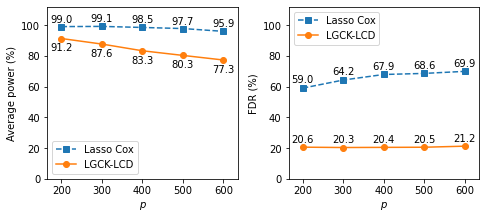

In [156]:
#Setting the font Arial
plt.rcParams["font.family"] = "Arial"

#Average power and FDR plots side-by-side
x_points = np.array(results.index)


fig, (ax1, ax2) = plt.subplots(1, 2)
#fig.suptitle('Empirical power and FDR as the number of predictors varies',fontsize=12)

#Figure size
mm = 1/25.4
fig.set_figwidth(174*mm)
fig.set_figheight(80*mm)


y1_points = np.array(results["CoxLasso_Power(%)"])
y2_points = np.array(results["knockoff_hat_Power(%)"])

for i, j in zip(x_points,y1_points):
    ax1.text(i, j+3, "{:.1f}".format(j), ha="center")
for i, j in zip(x_points,y2_points):
    ax1.text(i, j-8, "{:.1f}".format(j), ha="center")

ax1.plot(x_points, y1_points, marker = 's', label="Lasso Cox", linestyle='dashed')
ax1.plot(x_points, y2_points, marker = 'o',label="LGCK-LCD")

ax1.set_ylim(0, 112)
ax1.set_xlim(165, 635)
ax1.set_xticks(x_points)
ax1.legend(loc="lower left")
ax1.set_xlabel("$p$")
ax1.set_ylabel("Average power (%)",fontname='Arial')


y1_points = np.array(results["CoxLasso_FDP(%)"])
y2_points = np.array(results["knockoff_hat_FDP(%)"])
for i, j in zip(x_points,y1_points):
    ax2.text(i, j+3.5, "{:.1f}".format(j), ha="center")
for i, j in zip(x_points,y2_points):
    ax2.text(i, j+3, "{:.1f}".format(j), ha="center")


ax2.plot(x_points, y1_points, marker = 's', label="Lasso Cox", linestyle='dashed')
ax2.plot(x_points, y2_points, marker = 'o',label="LGCK-LCD")
ax2.set_ylim(0, 112)
ax2.set_xlim(165, 635)
ax2.set_xticks(x_points)
ax2.legend(loc="upper left")
ax2.set_xlabel("$p$")
ax2.set_ylabel("FDR (%)",fontname='Arial')

fig.tight_layout()
fig.savefig("Fig1.eps", format="eps", dpi=1200)
fig.savefig("t_n300_Varying_p_7sep22.jpg", format="jpg", dpi=300)

fig.show()

### Saving each simulation into an unified dataset

In [89]:
# #Inserting Sim_id
# for i in range(nsim):
#   Sim_id = np.repeat(i,repeats=n)
#   ls_simulations[i].insert(0, "Sim_id", Sim_id, True)
    
# #Final dataframe    
# simulations = ls_simulations[0]
# for i in range(1,nsim):
#   simulations= pd.concat([simulations,ls_simulations[i]],axis=0)

# simulations.reset_index(drop=True, inplace=True)


In [90]:
#Saving the dataset to csv file
#simulations.to_csv('Simulations_varying_p_2sep22.csv')

R[write to console]: There were 33 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 32 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warnings (use warnings() to see them)
R[write to console]: 

R[write to console]: There were 36 warni

In [119]:
nsim

200